## 🌐 Connect Colab to Google Drive

In [6]:
from google.colab import drive

drive.mount('/gdrive')
%cd /gdrive/My Drive/GEE_NO2/

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/My Drive/GEE_NO2


## ⚙️ Import Libraries

In [7]:
!pip install rasterio matplotlib geopandas ipywidgets folium

In [8]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

## ⏳ Load the Data

In [9]:
# Set data path and years
data_dir = '/gdrive/My Drive/GEE_NO2/'
years = [2019, 2020, 2021, 2022, 2023]
file_template = data_dir + 'NO2_Daily_Multiband_{}.tif'

## 1. Visualize data for each day over 5 years(2 sliders)

In [10]:
# 1. Read all years' data
all_bands = {}
for year in years:
    with rasterio.open(file_template.format(year)) as src:
        bands = src.read()  # shape: (num_bands, height, width)
        all_bands[year] = bands

# 2. Get number of days per year (auto-adapt)
days_per_year = {year: all_bands[year].shape[0] for year in years}

# 3. Compute global 99th percentile for colorbar vmax
all_values = np.concatenate([all_bands[year].flatten() for year in years])
global_vmax = np.nanpercentile(all_values, 99)

# 4. Visualization function
def show_band(year, day):
    bands = all_bands[year]
    band = bands[day - 1]
    plt.figure(figsize=(10, 6))
    plt.imshow(band, cmap='turbo', vmin=0, vmax=global_vmax)
    plt.title(f'NO₂ - {year} Day {day}')
    plt.colorbar(label='NO₂ Density')
    plt.figtext(0.5, -0.08, 'Region: Northern Italy, Po River Plain', ha='center', va='center', fontsize=14)
    plt.axis('off')
    plt.show()

# 5. Create sliders
year_slider = widgets.SelectionSlider(
    options=years, value=years[0], description='Year', continuous_update=False
)

def update_day_slider(*args):
    year = year_slider.value
    day_slider.max = days_per_year[year]
    if day_slider.value > day_slider.max:
        day_slider.value = 1

day_slider = widgets.IntSlider(
    min=1, max=days_per_year[years[0]], step=1, value=1, description='Day'
)
year_slider.observe(update_day_slider, names='value')

ui = widgets.HBox([year_slider, day_slider])
out = widgets.interactive_output(show_band, {'year': year_slider, 'day': day_slider})

display(ui, out)

Output()

## 2. Visualize data for each day over 5 years(1 sliders for 1826 days)

In [11]:
# 1. Read all years' data and concatenate
all_bands = []
days_per_year = []
for year in years:
    with rasterio.open(file_template.format(year)) as src:
        bands = src.read()  # shape: (num_bands, height, width)
        all_bands.append(bands)
        days_per_year.append(bands.shape[0])

# 2. Synthesis (total_days, height, width)
bands_concat = np.concatenate(all_bands, axis=0)
total_days = bands_concat.shape[0]

# 3. Calculate the global 99th percentile maximum
global_vmax = np.nanpercentile(bands_concat, 99)

# 4. Calculate the year and the number of days in that year for each day
day_to_year = []
for i, days in enumerate(days_per_year):
    day_to_year += [(years[i], d+1) for d in range(days)]

# 5. Visualization function
def show_long_series(day):
    band = bands_concat[day-1]
    year, day_in_year = day_to_year[day-1]
    plt.figure(figsize=(10, 6))
    plt.imshow(band, cmap='turbo', vmin=0, vmax=global_vmax)
    plt.title(f'NO₂ - {year} Day {day_in_year} (Global Day {day})')
    plt.colorbar(label='NO₂ Density')
    plt.axis('off')
    plt.figtext(0.5, -0.08, 'Region: Northern Italy, Po River Plain', ha='center', va='center', fontsize=14)
    plt.show()

# 6. Create slider
slider = widgets.IntSlider(min=1, max=total_days, step=1, value=1, description='Day')
out = widgets.interactive_output(show_long_series, {'day': slider})

display(slider, out)

IntSlider(value=1, description='Day', max=1826, min=1)

Output()

## 3. NO₂ 5-Year Combined Gap Map (2019–2023)

2019 bands: (365, 300, 621)
2020 bands: (366, 300, 621)
2021 bands: (365, 300, 621)
2022 bands: (365, 300, 621)
2023 bands: (365, 300, 621)


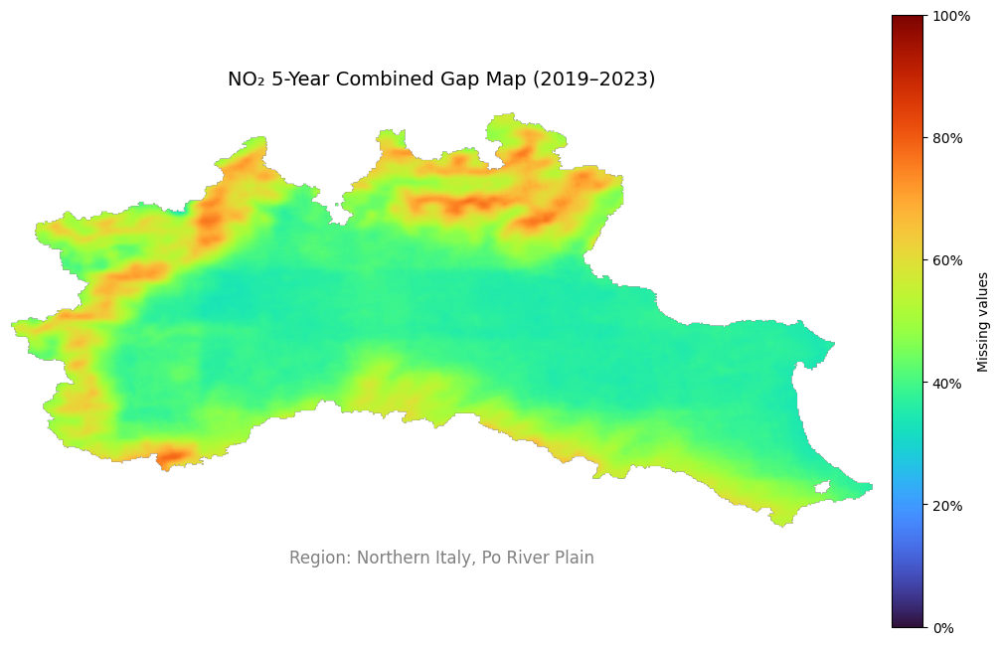


=== 5-Year Gap Statistics ===
Total days: 1826
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.454 (45.4%)
Median missing rate: 0.412 (41.2%)
Standard deviation: 0.099
90th percentile: 0.607 (60.7%)

Missing rate categories:
Low (<20%): 0.0%
Medium (20-50%): 70.4%
High (50-80%): 29.6%
Very High (≥80%): 0.0%

=== Files Saved ===
PNG file: NO2_5Year_Gap_Map_2019_2023.png (300 DPI)


In [ ]:
#!/usr/bin/env python3
"""
NO2 5-Year Gap Map Analysis

This script creates a 5-year combined gap map for NO2 data (2019-2023)
based on the user's SO2 analysis code.
"""

import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import geopandas as gpd
from rasterio.features import geometry_mask

# Define years and file template
years = [2019, 2020, 2021, 2022, 2023]
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Initialize variables
sum_gap = None
total_days = 0

# Iterate over each year and calculate missing statistics
for year in years:
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()  # shape: (days, height, width)
        print(f"{year} bands:", bands.shape)

        mask = (bands <= 0) | np.isnan(bands)  # 0 or nan is considered missing
        yearly_gap = np.sum(mask, axis=0)     # Missing days per pixel per year

        if sum_gap is None:
            sum_gap = yearly_gap
        else:
            sum_gap += yearly_gap

        total_days += bands.shape[0]

# Calculate the missing rate
gap_ratio_5yr = sum_gap / total_days

# Get spatial range and create AOI mask
with rasterio.open(file_template.format(2023)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to the gap ratio
masked_gap_aoi = ma.masked_where(~aoi_mask, gap_ratio_5yr)

# Calculate basic statistics
total_pixels_aoi = np.sum(aoi_mask)  # Total pixels in AOI

# Get valid data for statistics
valid_data = masked_gap_aoi.compressed()

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
total_valid_pixels = len(valid_data)
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Drawing
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(masked_gap_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)

# Colorbar is placed on the right to avoid blocking the text
cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

# Statistics are only printed to console, not displayed on the map

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

# Titles and Notes
ax.set_title("NO₂ 5-Year Combined Gap Map (2019–2023)", fontsize=14, pad=20)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_5Year_Gap_Map_2019_2023.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== 5-Year Gap Statistics ===")
print(f"Total days: {total_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_5Year_Gap_Map_2019_2023.png (300 DPI)")


## 4. NO₂ Missing Value Map (2019)

2019 bands: (365, 300, 621)


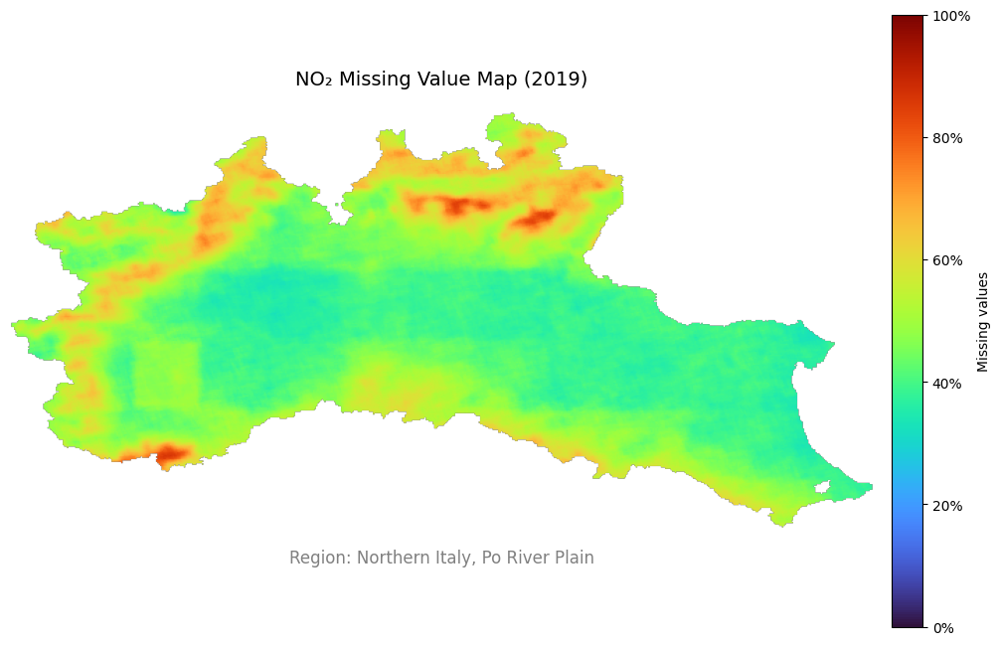


=== 2019 Gap Statistics ===
Total days: 365
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.469 (46.9%)
Median missing rate: 0.447 (44.7%)
Standard deviation: 0.092
90th percentile: 0.608 (60.8%)

Missing rate categories:
Low (<20%): 0.0%
Medium (20-50%): 68.1%
High (50-80%): 31.6%
Very High (≥80%): 0.3%

=== Files Saved ===
PNG file: NO2_Missing_Value_Map_2019.png (300 DPI)


In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

year = 2019
file_path = file_template.format(year)
with rasterio.open(file_path) as src:
    bands = src.read()  # shape: (days, height, width)
    print(f"{year} bands:", bands.shape)

    # 0 or nan is considered missing
    mask = (bands <= 0) | np.isnan(bands)
    yearly_gap = np.sum(mask, axis=0)     # Missing days per pixel in 2019
    total_days = bands.shape[0]
    gap_ratio = yearly_gap / total_days   # Missing rate per pixel

    # Get spatial range and create AOI mask
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to the gap ratio
masked_gap_aoi = ma.masked_where(~aoi_mask, gap_ratio)

# Calculate statistics
valid_data = masked_gap_aoi.compressed()
total_valid_pixels = len(valid_data)

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Drawing
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(masked_gap_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)

cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

ax.set_title("NO₂ Missing Value Map (2019)", fontsize=14, pad=20)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_Missing_Value_Map_2019.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== 2019 Gap Statistics ===")
print(f"Total days: {total_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_Missing_Value_Map_2019.png (300 DPI)")

## 5. NO₂ Missing Value Map (2020)

2020 bands: (366, 300, 621)


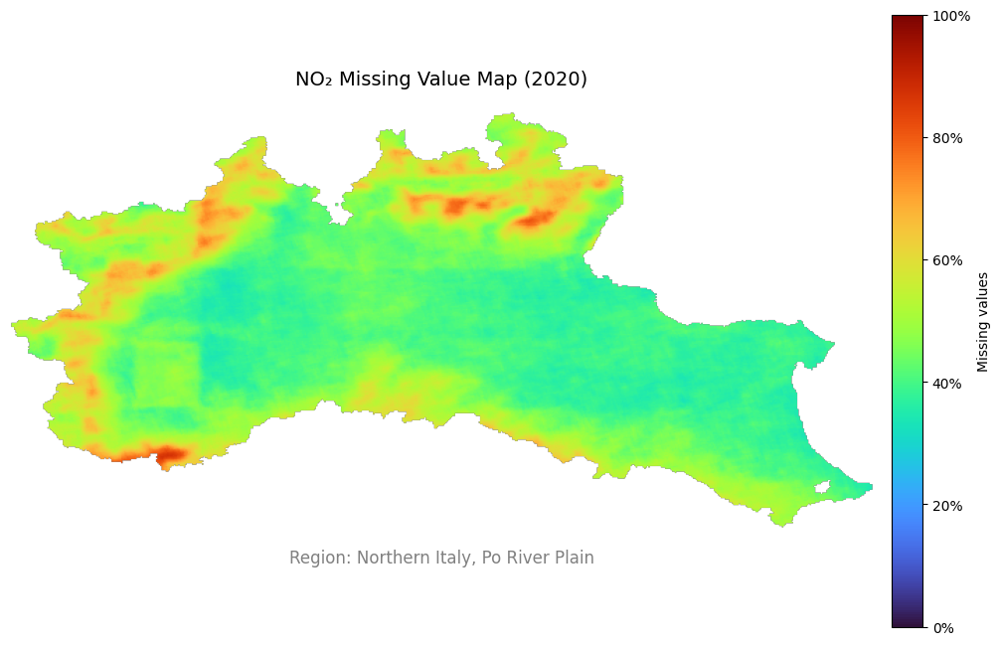


=== 2020 Gap Statistics ===
Total days: 366
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.462 (46.2%)
Median missing rate: 0.434 (43.4%)
Standard deviation: 0.088
90th percentile: 0.593 (59.3%)

Missing rate categories:
Low (<20%): 0.0%
Medium (20-50%): 70.8%
High (50-80%): 29.0%
Very High (≥80%): 0.1%

=== Files Saved ===
PNG file: NO2_Missing_Value_Map_2020.png (300 DPI)


In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

year = 2020
file_path = file_template.format(year)
with rasterio.open(file_path) as src:
    bands = src.read()  # shape: (days, height, width)
    print(f"{year} bands:", bands.shape)

    # 0 or nan is considered missing
    mask = (bands <= 0) | np.isnan(bands)
    yearly_gap = np.sum(mask, axis=0)     # Missing days per pixel in 2020
    total_days = bands.shape[0]
    gap_ratio = yearly_gap / total_days   # Missing rate per pixel

    # Get spatial range and create AOI mask
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to the gap ratio
masked_gap_aoi = ma.masked_where(~aoi_mask, gap_ratio)

# Calculate statistics
valid_data = masked_gap_aoi.compressed()
total_valid_pixels = len(valid_data)

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Drawing
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(masked_gap_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)

cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

ax.set_title("NO₂ Missing Value Map (2020)", fontsize=14, pad=20)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_Missing_Value_Map_2020.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== 2020 Gap Statistics ===")
print(f"Total days: {total_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_Missing_Value_Map_2020.png (300 DPI)")

## 6. NO₂ Missing Value Map (2021)

2021 bands: (365, 300, 621)


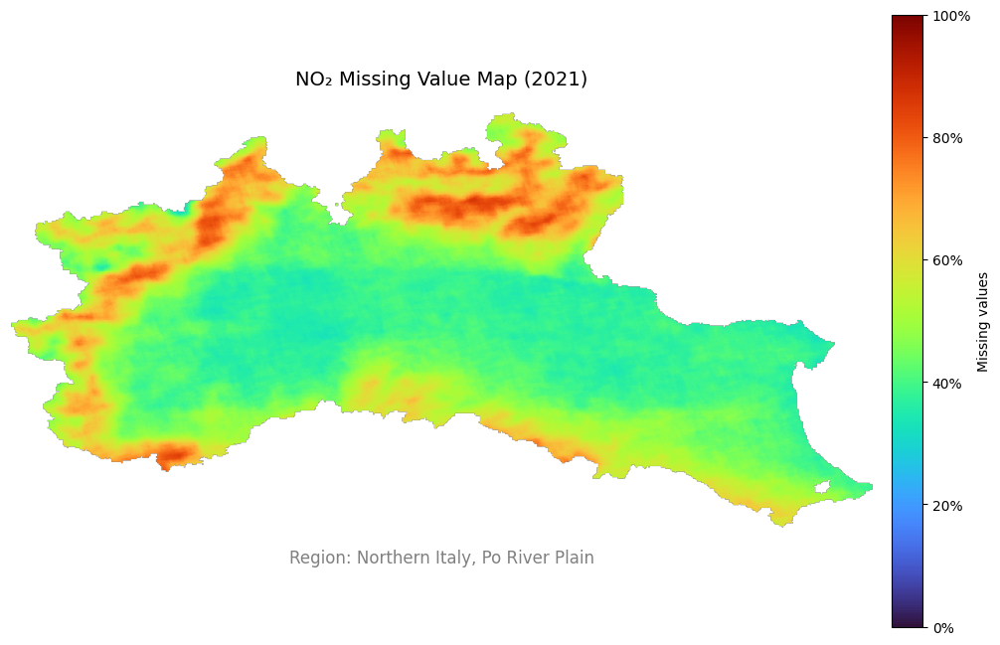


=== 2021 Gap Statistics ===
Total days: 365
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.485 (48.5%)
Median missing rate: 0.444 (44.4%)
Standard deviation: 0.116
90th percentile: 0.666 (66.6%)

Missing rate categories:
Low (<20%): 0.0%
Medium (20-50%): 63.2%
High (50-80%): 36.2%
Very High (≥80%): 0.7%

=== Files Saved ===
PNG file: NO2_Missing_Value_Map_2021.png (300 DPI)


In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

year = 2021
file_path = file_template.format(year)
with rasterio.open(file_path) as src:
    bands = src.read()  # shape: (days, height, width)
    print(f"{year} bands:", bands.shape)

    # 0 or nan is considered missing
    mask = (bands <= 0) | np.isnan(bands)
    yearly_gap = np.sum(mask, axis=0)     # Missing days per pixel in 2021
    total_days = bands.shape[0]
    gap_ratio = yearly_gap / total_days   # Missing rate per pixel

    # Get spatial range and create AOI mask
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to the gap ratio
masked_gap_aoi = ma.masked_where(~aoi_mask, gap_ratio)

# Calculate statistics
valid_data = masked_gap_aoi.compressed()
total_valid_pixels = len(valid_data)

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Drawing
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(masked_gap_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)

cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

ax.set_title("NO₂ Missing Value Map (2021)", fontsize=14, pad=20)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_Missing_Value_Map_2021.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== 2021 Gap Statistics ===")
print(f"Total days: {total_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_Missing_Value_Map_2021.png (300 DPI)")

## 7. NO₂ Missing Value Map (2022)

2022 bands: (365, 300, 621)


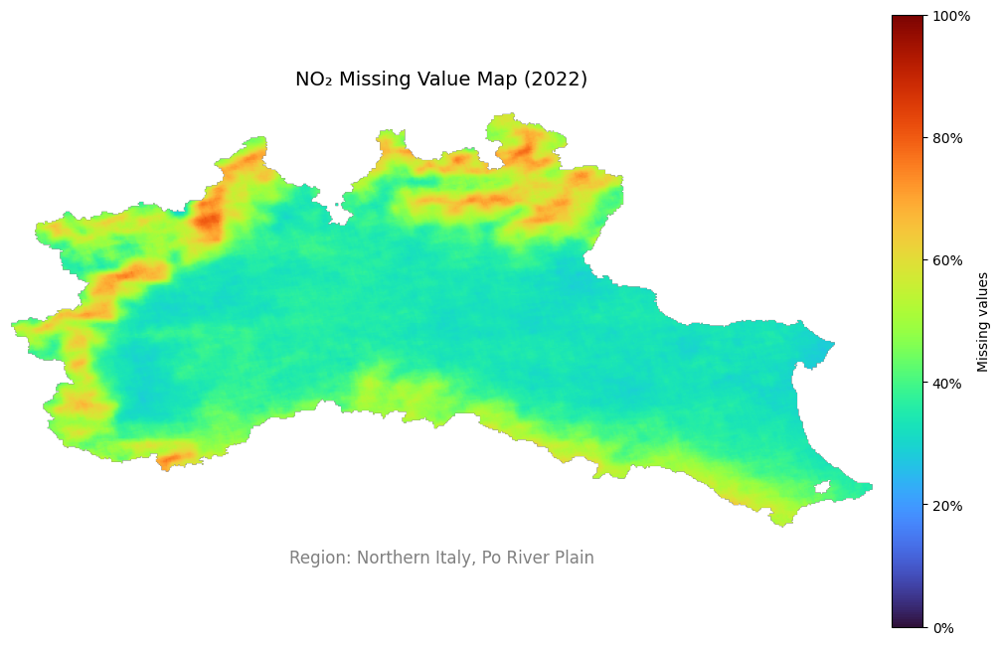


=== 2022 Gap Statistics ===
Total days: 365
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.413 (41.3%)
Median missing rate: 0.370 (37.0%)
Standard deviation: 0.101
90th percentile: 0.573 (57.3%)

Missing rate categories:
Low (<20%): 0.0%
Medium (20-50%): 79.7%
High (50-80%): 20.3%
Very High (≥80%): 0.0%

=== Files Saved ===
PNG file: NO2_Missing_Value_Map_2022.png (300 DPI)


In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

year = 2022
file_path = file_template.format(year)
with rasterio.open(file_path) as src:
    bands = src.read()  # shape: (days, height, width)
    print(f"{year} bands:", bands.shape)

    # 0 or nan is considered missing
    mask = (bands <= 0) | np.isnan(bands)
    yearly_gap = np.sum(mask, axis=0)     # Missing days per pixel in 2022
    total_days = bands.shape[0]
    gap_ratio = yearly_gap / total_days   # Missing rate per pixel

    # Get spatial range and create AOI mask
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to the gap ratio
masked_gap_aoi = ma.masked_where(~aoi_mask, gap_ratio)

# Calculate statistics
valid_data = masked_gap_aoi.compressed()
total_valid_pixels = len(valid_data)

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Drawing
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(masked_gap_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)

cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

ax.set_title("NO₂ Missing Value Map (2022)", fontsize=14, pad=20)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_Missing_Value_Map_2022.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== 2022 Gap Statistics ===")
print(f"Total days: {total_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_Missing_Value_Map_2022.png (300 DPI)")

## 8. NO₂ Missing Value Map (2023:)

2023 bands: (365, 300, 621)


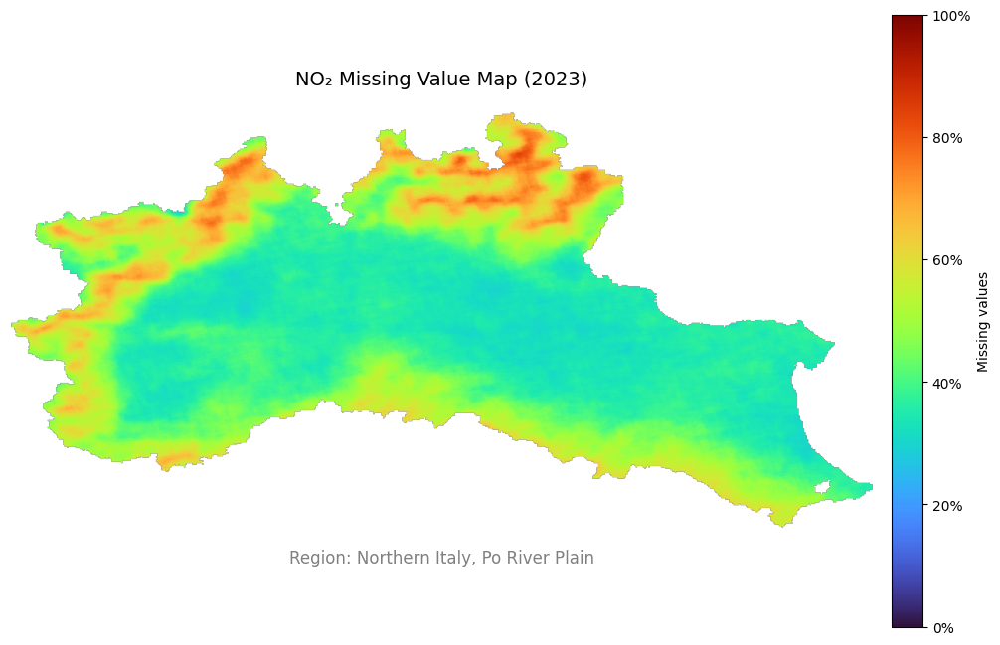


=== 2023 Gap Statistics ===
Total days: 365
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.441 (44.1%)
Median missing rate: 0.395 (39.5%)
Standard deviation: 0.113
90th percentile: 0.611 (61.1%)

Missing rate categories:
Low (<20%): 0.0%
Medium (20-50%): 71.1%
High (50-80%): 28.9%
Very High (≥80%): 0.1%

=== Files Saved ===
PNG file: NO2_Missing_Value_Map_2023.png (300 DPI)


In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

year = 2023
file_path = file_template.format(year)
with rasterio.open(file_path) as src:
    bands = src.read()  # shape: (days, height, width)
    print(f"{year} bands:", bands.shape)

    # 0 or nan is considered missing
    mask = (bands <= 0) | np.isnan(bands)
    yearly_gap = np.sum(mask, axis=0)     # Missing days per pixel in 2023
    total_days = bands.shape[0]
    gap_ratio = yearly_gap / total_days   # Missing rate per pixel

    # Get spatial range and create AOI mask
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to the gap ratio
masked_gap_aoi = ma.masked_where(~aoi_mask, gap_ratio)

# Calculate statistics
valid_data = masked_gap_aoi.compressed()
total_valid_pixels = len(valid_data)

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Drawing
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(masked_gap_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)

cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

ax.set_title("NO₂ Missing Value Map (2023)", fontsize=14, pad=20)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_Missing_Value_Map_2023.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== 2023 Gap Statistics ===")
print(f"Total days: {total_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_Missing_Value_Map_2023.png (300 DPI)")

## 9. NO₂ Spring (MAM) Missing Value Map (2019–2023)

2019 spring bands: (92, 300, 621)
2020 spring bands: (92, 300, 621)
2021 spring bands: (92, 300, 621)
2022 spring bands: (92, 300, 621)
2023 spring bands: (92, 300, 621)


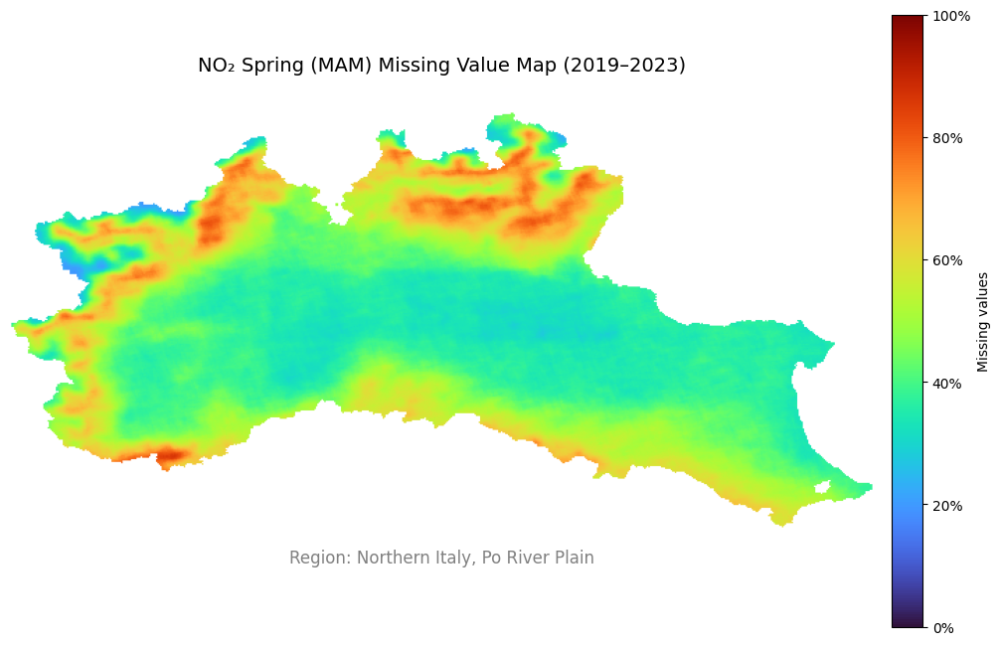


=== Spring (MAM) Gap Statistics (2019-2023) ===
Total spring days: 460
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.460 (46.0%)
Median missing rate: 0.422 (42.2%)
Standard deviation: 0.119
90th percentile: 0.637 (63.7%)

Missing rate categories:
Low (<20%): 0.0%
Medium (20-50%): 65.9%
High (50-80%): 33.9%
Very High (≥80%): 0.2%

=== Files Saved ===
PNG file: NO2_Spring_Missing_Value_Map_2019_2023.png (300 DPI)


In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask

# Define years and file template
years = [2019, 2020, 2021, 2022, 2023]
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get indices for March, April, May (spring) for a given year
def get_spring_indices(year):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    # March 1st is the (sum of days in Jan-Feb) + 1
    mar_start = sum(days_in_month[:2])
    # April 1st is the (sum of days in Jan-Mar)
    apr_start = sum(days_in_month[:3])
    # May 1st is the (sum of days in Jan-Apr)
    may_start = sum(days_in_month[:4])
    # March indices
    mar_indices = list(range(mar_start, mar_start + days_in_month[2]))
    # April indices
    apr_indices = list(range(apr_start, apr_start + days_in_month[3]))
    # May indices
    may_indices = list(range(may_start, may_start + days_in_month[4]))
    return mar_indices + apr_indices + may_indices

# Initialize variables for gap statistics
sum_gap = None
total_spring_days = 0

for year in years:
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()  # shape: (days, height, width)
        spring_idx = get_spring_indices(year)
        spring_bands = bands[spring_idx, :, :]
        print(f"{year} spring bands:", spring_bands.shape)

        # Missing if value <= 0 or NaN
        mask = (spring_bands <= 0) | np.isnan(spring_bands)
        yearly_gap = np.sum(mask, axis=0)  # Missing days per pixel in spring

        if sum_gap is None:
            sum_gap = yearly_gap
        else:
            sum_gap += yearly_gap

        total_spring_days += spring_bands.shape[0]

# Calculate the missing rate (no masking yet)
gap_ratio_spring = sum_gap / total_spring_days

# Get spatial extent and transform from the last year file
with rasterio.open(file_template.format(2023)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask (True inside AOI, False outside) - FIXED: using union_all() instead of unary_union
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Mask outside AOI (set to masked, will show as white)
gap_ratio_spring_aoi = ma.masked_where(~aoi_mask, gap_ratio_spring)

# Calculate statistics
valid_data = gap_ratio_spring_aoi.compressed()
total_valid_pixels = len(valid_data)

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(gap_ratio_spring_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)
im.cmap.set_bad(color='white')  # AOI outside as white
cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

# Title with increased padding to move it further from the plot
ax.set_title("NO₂ Spring (MAM) Missing Value Map (2019–2023)", fontsize=14, pad=30)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_Spring_Missing_Value_Map_2019_2023.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== Spring (MAM) Gap Statistics (2019-2023) ===")
print(f"Total spring days: {total_spring_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_Spring_Missing_Value_Map_2019_2023.png (300 DPI)")

## 10. NO₂ Summer (JJA) Missing Value Map (2019–2023)

2019 summer bands: (92, 300, 621)
2020 summer bands: (92, 300, 621)
2021 summer bands: (92, 300, 621)
2022 summer bands: (92, 300, 621)
2023 summer bands: (92, 300, 621)


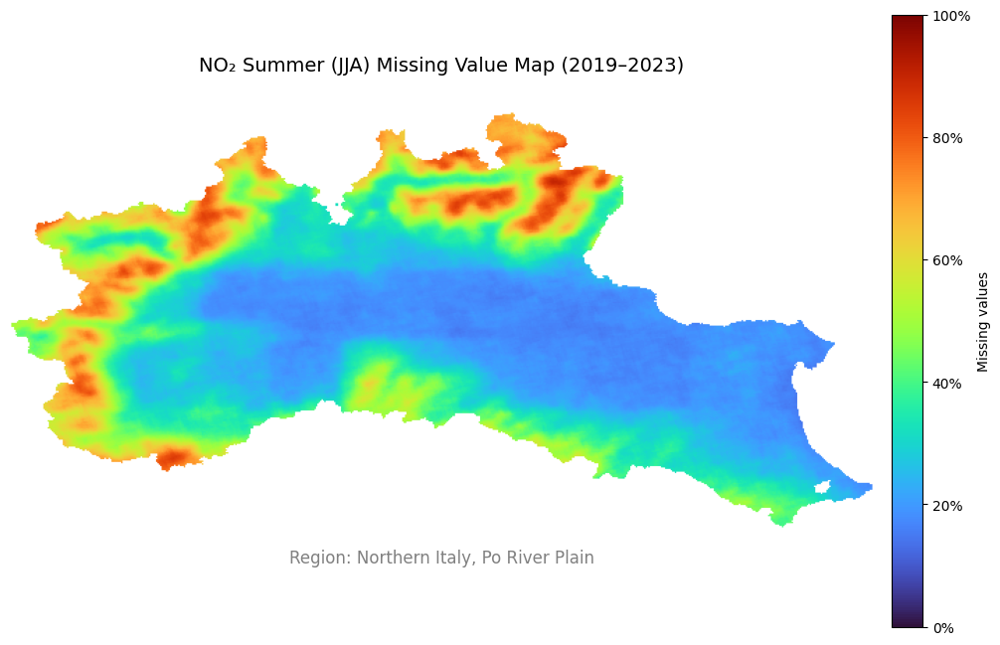


=== Summer (JJA) Gap Statistics (2019-2023) ===
Total summer days: 460
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.356 (35.6%)
Median missing rate: 0.298 (29.8%)
Standard deviation: 0.180
90th percentile: 0.654 (65.4%)

Missing rate categories:
Low (<20%): 25.4%
Medium (20-50%): 52.0%
High (50-80%): 21.4%
Very High (≥80%): 1.1%

=== Files Saved ===
PNG file: NO2_Summer_Missing_Value_Map_2019_2023.png (300 DPI)


In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask

# Define years and file template
years = [2019, 2020, 2021, 2022, 2023]
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get indices for June, July, August (summer) for a given year
def get_summer_indices(year):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    # June 1st is the (sum of days in Jan-May)
    jun_start = sum(days_in_month[:5])
    # July 1st is the (sum of days in Jan-Jun)
    jul_start = sum(days_in_month[:6])
    # August 1st is the (sum of days in Jan-Jul)
    aug_start = sum(days_in_month[:7])
    # June indices
    jun_indices = list(range(jun_start, jun_start + days_in_month[5]))
    # July indices
    jul_indices = list(range(jul_start, jul_start + days_in_month[6]))
    # August indices
    aug_indices = list(range(aug_start, aug_start + days_in_month[7]))
    return jun_indices + jul_indices + aug_indices

# Initialize variables for gap statistics
sum_gap = None
total_summer_days = 0

for year in years:
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()  # shape: (days, height, width)
        summer_idx = get_summer_indices(year)
        summer_bands = bands[summer_idx, :, :]
        print(f"{year} summer bands:", summer_bands.shape)

        # Missing if value <= 0 or NaN
        mask = (summer_bands <= 0) | np.isnan(summer_bands)
        yearly_gap = np.sum(mask, axis=0)  # Missing days per pixel in summer

        if sum_gap is None:
            sum_gap = yearly_gap
        else:
            sum_gap += yearly_gap

        total_summer_days += summer_bands.shape[0]

# Calculate the missing rate (no masking yet)
gap_ratio_summer = sum_gap / total_summer_days

# Get spatial extent and transform from the last year file
with rasterio.open(file_template.format(2023)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask (True inside AOI, False outside)
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Mask outside AOI (set to masked, will show as white)
gap_ratio_summer_aoi = ma.masked_where(~aoi_mask, gap_ratio_summer)

# Calculate statistics
valid_data = gap_ratio_summer_aoi.compressed()
total_valid_pixels = len(valid_data)

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(gap_ratio_summer_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)
im.cmap.set_bad(color='white')  # AOI outside as white
cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

# Title with increased padding to move it further from the plot
ax.set_title("NO₂ Summer (JJA) Missing Value Map (2019–2023)", fontsize=14, pad=30)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_Summer_Missing_Value_Map_2019_2023.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== Summer (JJA) Gap Statistics (2019-2023) ===")
print(f"Total summer days: {total_summer_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_Summer_Missing_Value_Map_2019_2023.png (300 DPI)")

## 11. NO₂ Autumn (SON) Missing Value Map (2019–2023)

2019 autumn bands: (91, 300, 621)
2020 autumn bands: (91, 300, 621)
2021 autumn bands: (91, 300, 621)
2022 autumn bands: (91, 300, 621)
2023 autumn bands: (91, 300, 621)


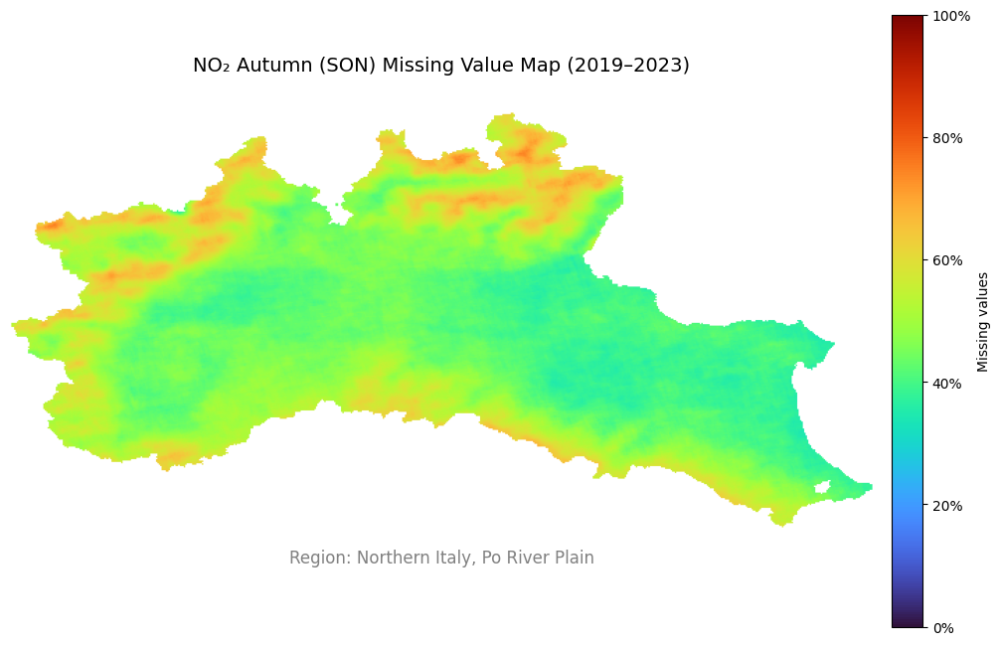


=== Autumn (SON) Gap Statistics (2019-2023) ===
Total autumn days: 455
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.475 (47.5%)
Median missing rate: 0.455 (45.5%)
Standard deviation: 0.078
90th percentile: 0.596 (59.6%)

Missing rate categories:
Low (<20%): 0.0%
Medium (20-50%): 67.2%
High (50-80%): 32.8%
Very High (≥80%): 0.0%

=== Files Saved ===
PNG file: NO2_Autumn_Missing_Value_Map_2019_2023.png (300 DPI)


In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask

# Define years and file template
years = [2019, 2020, 2021, 2022, 2023]
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get indices for September, October, November (autumn) for a given year
def get_autumn_indices(year):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    # September 1st is the (sum of days in Jan-Aug)
    sep_start = sum(days_in_month[:8])
    # October 1st is the (sum of days in Jan-Sep)
    oct_start = sum(days_in_month[:9])
    # November 1st is the (sum of days in Jan-Oct)
    nov_start = sum(days_in_month[:10])
    # September indices
    sep_indices = list(range(sep_start, sep_start + days_in_month[8]))
    # October indices
    oct_indices = list(range(oct_start, oct_start + days_in_month[9]))
    # November indices
    nov_indices = list(range(nov_start, nov_start + days_in_month[10]))
    return sep_indices + oct_indices + nov_indices

# Initialize variables for gap statistics
sum_gap = None
total_autumn_days = 0

for year in years:
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()  # shape: (days, height, width)
        autumn_idx = get_autumn_indices(year)
        autumn_bands = bands[autumn_idx, :, :]
        print(f"{year} autumn bands:", autumn_bands.shape)

        # Missing if value <= 0 or NaN
        mask = (autumn_bands <= 0) | np.isnan(autumn_bands)
        yearly_gap = np.sum(mask, axis=0)  # Missing days per pixel in autumn

        if sum_gap is None:
            sum_gap = yearly_gap
        else:
            sum_gap += yearly_gap

        total_autumn_days += autumn_bands.shape[0]

# Calculate the missing rate (no masking yet)
gap_ratio_autumn = sum_gap / total_autumn_days

# Get spatial extent and transform from the last year file
with rasterio.open(file_template.format(2023)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask (True inside AOI, False outside)
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Mask outside AOI (set to masked, will show as white)
gap_ratio_autumn_aoi = ma.masked_where(~aoi_mask, gap_ratio_autumn)

# Calculate statistics
valid_data = gap_ratio_autumn_aoi.compressed()
total_valid_pixels = len(valid_data)

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(gap_ratio_autumn_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)
im.cmap.set_bad(color='white')  # AOI outside as white
cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

# Title with increased padding to move it further from the plot
ax.set_title("NO₂ Autumn (SON) Missing Value Map (2019–2023)", fontsize=14, pad=30)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_Autumn_Missing_Value_Map_2019_2023.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== Autumn (SON) Gap Statistics (2019-2023) ===")
print(f"Total autumn days: {total_autumn_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_Autumn_Missing_Value_Map_2019_2023.png (300 DPI)")

## 12. NO₂ Winter (DJF) Missing Value Map (2019–2023)

2019 winter bands: (90, 300, 621)
2020 winter bands: (91, 300, 621)
2021 winter bands: (90, 300, 621)
2022 winter bands: (90, 300, 621)
2023 winter bands: (90, 300, 621)


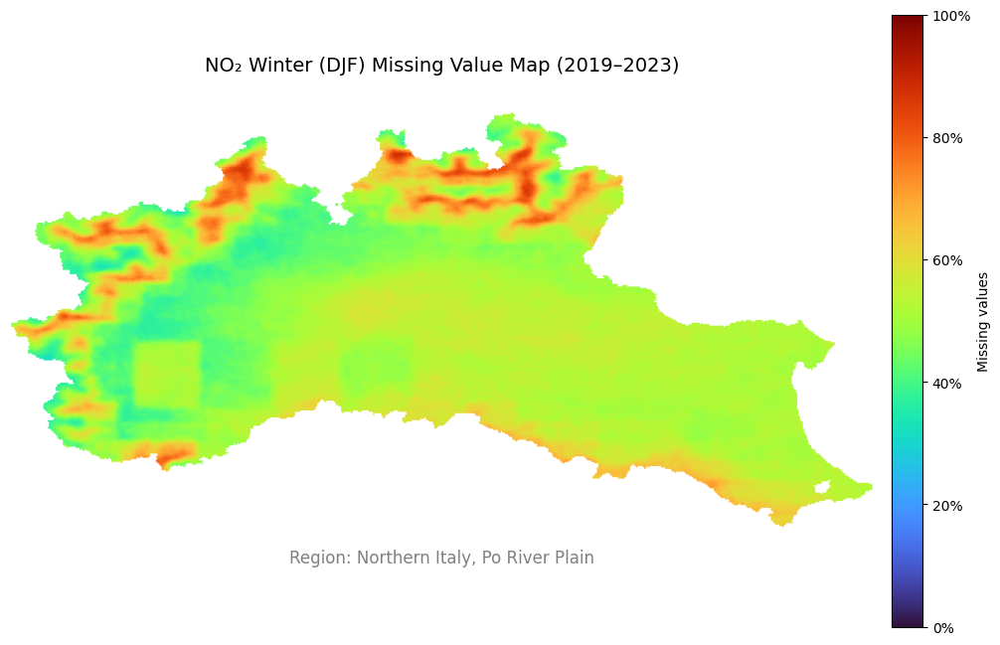


=== Winter (DJF) Gap Statistics (2019-2023) ===
Total winter days: 451
Valid pixels: 94666

Missing rate statistics:
Mean missing rate: 0.527 (52.7%)
Median missing rate: 0.523 (52.3%)
Standard deviation: 0.079
90th percentile: 0.627 (62.7%)

Missing rate categories:
Low (<20%): 0.0%
Medium (20-50%): 32.2%
High (50-80%): 67.3%
Very High (≥80%): 0.5%

=== Files Saved ===
PNG file: NO2_Winter_Missing_Value_Map_2019_2023.png (300 DPI)


In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask

# Define years and file template
years = [2019, 2020, 2021, 2022, 2023]
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get indices for December, January, February (winter) for a given year
def get_winter_indices(year):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    # December 1st is the (sum of days in Jan-Nov)
    dec_start = sum(days_in_month[:11])
    # January 1st is day 0 (first day of the year)
    jan_start = 0
    # February 1st is the (days in January)
    feb_start = days_in_month[0]
    # December indices
    dec_indices = list(range(dec_start, dec_start + days_in_month[11]))
    # January indices
    jan_indices = list(range(jan_start, jan_start + days_in_month[0]))
    # February indices
    feb_indices = list(range(feb_start, feb_start + days_in_month[1]))
    return dec_indices + jan_indices + feb_indices

# Initialize variables for gap statistics
sum_gap = None
total_winter_days = 0

for year in years:
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()  # shape: (days, height, width)
        winter_idx = get_winter_indices(year)
        winter_bands = bands[winter_idx, :, :]
        print(f"{year} winter bands:", winter_bands.shape)

        # Missing if value <= 0 or NaN
        mask = (winter_bands <= 0) | np.isnan(winter_bands)
        yearly_gap = np.sum(mask, axis=0)  # Missing days per pixel in winter

        if sum_gap is None:
            sum_gap = yearly_gap
        else:
            sum_gap += yearly_gap

        total_winter_days += winter_bands.shape[0]

# Calculate the missing rate (no masking yet)
gap_ratio_winter = sum_gap / total_winter_days

# Get spatial extent and transform from the last year file
with rasterio.open(file_template.format(2023)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask (True inside AOI, False outside)
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Mask outside AOI (set to masked, will show as white)
gap_ratio_winter_aoi = ma.masked_where(~aoi_mask, gap_ratio_winter)

# Calculate statistics
valid_data = gap_ratio_winter_aoi.compressed()
total_valid_pixels = len(valid_data)

mean_missing = np.mean(valid_data)
median_missing = np.median(valid_data)
std_missing = np.std(valid_data)
p90 = np.percentile(valid_data, 90)

# Missing rate categories
low_missing = np.sum(valid_data < 0.2)
medium_missing = np.sum((valid_data >= 0.2) & (valid_data < 0.5))
high_missing = np.sum((valid_data >= 0.5) & (valid_data < 0.8))
very_high_missing = np.sum(valid_data >= 0.8)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(gap_ratio_winter_aoi, extent=extent, cmap='turbo', vmin=0, vmax=1)
im.cmap.set_bad(color='white')  # AOI outside as white
cbar = plt.colorbar(im, orientation='vertical', fraction=0.046, pad=0.02)

ticks = np.linspace(0, 1, 6)
cbar.set_ticks(ticks)
cbar.set_ticklabels([f"{int(t*100)}%" for t in ticks])
cbar.set_label("Missing values")

# Title with increased padding to move it further from the plot
ax.set_title("NO₂ Winter (DJF) Missing Value Map (2019–2023)", fontsize=14, pad=30)
ax.annotate(
    'Region: Northern Italy, Po River Plain',
    xy=(0.5, -0.08), xycoords='axes fraction',
    ha='center', fontsize=12, color='gray'
)
ax.axis('off')

# Save the figure with high quality
plt.savefig('NO2_Winter_Missing_Value_Map_2019_2023.png',
            dpi=300,
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# Print statistics
print(f"\n=== Winter (DJF) Gap Statistics (2019-2023) ===")
print(f"Total winter days: {total_winter_days}")
print(f"Valid pixels: {total_valid_pixels}")
print(f"\nMissing rate statistics:")
print(f"Mean missing rate: {mean_missing:.3f} ({mean_missing*100:.1f}%)")
print(f"Median missing rate: {median_missing:.3f} ({median_missing*100:.1f}%)")
print(f"Standard deviation: {std_missing:.3f}")
print(f"90th percentile: {p90:.3f} ({p90*100:.1f}%)")
print(f"\nMissing rate categories:")
print(f"Low (<20%): {low_missing/total_valid_pixels*100:.1f}%")
print(f"Medium (20-50%): {medium_missing/total_valid_pixels*100:.1f}%")
print(f"High (50-80%): {high_missing/total_valid_pixels*100:.1f}%")
print(f"Very High (≥80%): {very_high_missing/total_valid_pixels*100:.1f}%")

print(f"\n=== Files Saved ===")
print(f"PNG file: NO2_Winter_Missing_Value_Map_2019_2023.png (300 DPI)")

## 13. NO₂ Comprehensive Statistics(5 Years/Each Year/Season)

In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask
import pandas as pd
from tabulate import tabulate

# Define years and file template
years = [2019, 2020, 2021, 2022, 2023]
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get seasonal indices
def get_spring_indices(year):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    mar_start = sum(days_in_month[:2])
    apr_start = sum(days_in_month[:3])
    may_start = sum(days_in_month[:4])
    mar_indices = list(range(mar_start, mar_start + days_in_month[2]))
    apr_indices = list(range(apr_start, apr_start + days_in_month[3]))
    may_indices = list(range(may_start, may_start + days_in_month[4]))
    return mar_indices + apr_indices + may_indices

def get_summer_indices(year):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    jun_start = sum(days_in_month[:5])
    jul_start = sum(days_in_month[:6])
    aug_start = sum(days_in_month[:7])
    jun_indices = list(range(jun_start, jun_start + days_in_month[5]))
    jul_indices = list(range(jul_start, jul_start + days_in_month[6]))
    aug_indices = list(range(aug_start, aug_start + days_in_month[7]))
    return jun_indices + jul_indices + aug_indices

def get_autumn_indices(year):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    sep_start = sum(days_in_month[:8])
    oct_start = sum(days_in_month[:9])
    nov_start = sum(days_in_month[:10])
    sep_indices = list(range(sep_start, sep_start + days_in_month[8]))
    oct_indices = list(range(oct_start, oct_start + days_in_month[9]))
    nov_indices = list(range(nov_start, nov_start + days_in_month[10]))
    return sep_indices + oct_indices + nov_indices

def get_winter_indices(year):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    dec_start = sum(days_in_month[:11])
    jan_start = 0
    feb_start = days_in_month[0]
    dec_indices = list(range(dec_start, dec_start + days_in_month[11]))
    jan_indices = list(range(jan_start, jan_start + days_in_month[0]))
    feb_indices = list(range(feb_start, feb_start + days_in_month[1]))
    return dec_indices + jan_indices + feb_indices

# Get spatial extent and transform
with rasterio.open(file_template.format(2023)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Initialize results storage
results = {
    '5_year': {},
    'annual': {},
    'seasonal': {}
}

# 1. 5-Year Overall Statistics
print("Calculating 5-year overall statistics...")
sum_gap_5yr = None
total_days_5yr = 0

for year in years:
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()
        mask = (bands <= 0) | np.isnan(bands)
        yearly_gap = np.sum(mask, axis=0)

        if sum_gap_5yr is None:
            sum_gap_5yr = yearly_gap
        else:
            sum_gap_5yr += yearly_gap

        total_days_5yr += bands.shape[0]

gap_ratio_5yr = sum_gap_5yr / total_days_5yr
gap_ratio_5yr_aoi = ma.masked_where(~aoi_mask, gap_ratio_5yr)
valid_data_5yr = gap_ratio_5yr_aoi.compressed()

results['5_year'] = {
    'total_days': total_days_5yr,
    'valid_pixels': len(valid_data_5yr),
    'mean_missing': np.mean(valid_data_5yr),
    'median_missing': np.median(valid_data_5yr),
    'std_missing': np.std(valid_data_5yr),
    'p90': np.percentile(valid_data_5yr, 90),
    'low_missing': np.sum(valid_data_5yr < 0.2),
    'medium_missing': np.sum((valid_data_5yr >= 0.2) & (valid_data_5yr < 0.5)),
    'high_missing': np.sum((valid_data_5yr >= 0.5) & (valid_data_5yr < 0.8)),
    'very_high_missing': np.sum(valid_data_5yr >= 0.8)
}

# 2. Annual Statistics
print("Calculating annual statistics...")
for year in years:
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()
        mask = (bands <= 0) | np.isnan(bands)
        yearly_gap = np.sum(mask, axis=0)
        gap_ratio = yearly_gap / bands.shape[0]
        gap_ratio_aoi = ma.masked_where(~aoi_mask, gap_ratio)
        valid_data = gap_ratio_aoi.compressed()

        results['annual'][year] = {
            'total_days': bands.shape[0],
            'valid_pixels': len(valid_data),
            'mean_missing': np.mean(valid_data),
            'median_missing': np.median(valid_data),
            'std_missing': np.std(valid_data),
            'p90': np.percentile(valid_data, 90),
            'low_missing': np.sum(valid_data < 0.2),
            'medium_missing': np.sum((valid_data >= 0.2) & (valid_data < 0.5)),
            'high_missing': np.sum((valid_data >= 0.5) & (valid_data < 0.8)),
            'very_high_missing': np.sum(valid_data >= 0.8)
        }

# 3. Seasonal Statistics
print("Calculating seasonal statistics...")
seasons = {
    'Spring': get_spring_indices,
    'Summer': get_summer_indices,
    'Autumn': get_autumn_indices,
    'Winter': get_winter_indices
}

for season_name, season_func in seasons.items():
    sum_gap_season = None
    total_days_season = 0

    for year in years:
        file_path = file_template.format(year)
        with rasterio.open(file_path) as src:
            bands = src.read()
            season_idx = season_func(year)
            season_bands = bands[season_idx, :, :]

            mask = (season_bands <= 0) | np.isnan(season_bands)
            yearly_gap = np.sum(mask, axis=0)

            if sum_gap_season is None:
                sum_gap_season = yearly_gap
            else:
                sum_gap_season += yearly_gap

            total_days_season += season_bands.shape[0]

    gap_ratio_season = sum_gap_season / total_days_season
    gap_ratio_season_aoi = ma.masked_where(~aoi_mask, gap_ratio_season)
    valid_data_season = gap_ratio_season_aoi.compressed()

    results['seasonal'][season_name] = {
        'total_days': total_days_season,
        'valid_pixels': len(valid_data_season),
        'mean_missing': np.mean(valid_data_season),
        'median_missing': np.median(valid_data_season),
        'std_missing': np.std(valid_data_season),
        'p90': np.percentile(valid_data_season, 90),
        'low_missing': np.sum(valid_data_season < 0.2),
        'medium_missing': np.sum((valid_data_season >= 0.2) & (valid_data_season < 0.5)),
        'high_missing': np.sum((valid_data_season >= 0.5) & (valid_data_season < 0.8)),
        'very_high_missing': np.sum(valid_data_season >= 0.8)
    }

# Create tables
print("\n" + "="*80)
print("NO₂ MISSING VALUE STATISTICS (2019-2023)")
print("="*80)

# 1. 5-Year Overall Table
print("\n1. 5-YEAR OVERALL STATISTICS")
print("-" * 50)
overall_data = results['5_year']
overall_table = [
    ["Total Days", f"{overall_data['total_days']}"],
    ["Valid Pixels", f"{overall_data['valid_pixels']:,}"],
    ["Mean Missing Rate", f"{overall_data['mean_missing']:.3f} ({overall_data['mean_missing']*100:.1f}%)"],
    ["Median Missing Rate", f"{overall_data['median_missing']:.3f} ({overall_data['median_missing']*100:.1f}%)"],
    ["Standard Deviation", f"{overall_data['std_missing']:.3f}"],
    ["90th Percentile", f"{overall_data['p90']:.3f} ({overall_data['p90']*100:.1f}%)"],
    ["Low (<20%)", f"{overall_data['low_missing']:,} ({overall_data['low_missing']/overall_data['valid_pixels']*100:.1f}%)"],
    ["Medium (20-50%)", f"{overall_data['medium_missing']:,} ({overall_data['medium_missing']/overall_data['valid_pixels']*100:.1f}%)"],
    ["High (50-80%)", f"{overall_data['high_missing']:,} ({overall_data['high_missing']/overall_data['valid_pixels']*100:.1f}%)"],
    ["Very High (≥80%)", f"{overall_data['very_high_missing']:,} ({overall_data['very_high_missing']/overall_data['valid_pixels']*100:.1f}%)"]
]
print(tabulate(overall_table, headers=["Metric", "Value"], tablefmt="grid"))

# 2. Annual Statistics Table
print("\n2. ANNUAL STATISTICS")
print("-" * 50)
annual_headers = ["Year", "Days", "Valid Pixels", "Mean (%)", "Median (%)", "Std Dev", "P90 (%)", "Low (%)", "Medium (%)", "High (%)", "Very High (%)"]
annual_table = []

for year in years:
    data = results['annual'][year]
    annual_table.append([
        year,
        data['total_days'],
        f"{data['valid_pixels']:,}",
        f"{data['mean_missing']*100:.1f}",
        f"{data['median_missing']*100:.1f}",
        f"{data['std_missing']:.3f}",
        f"{data['p90']*100:.1f}",
        f"{data['low_missing']/data['valid_pixels']*100:.1f}",
        f"{data['medium_missing']/data['valid_pixels']*100:.1f}",
        f"{data['high_missing']/data['valid_pixels']*100:.1f}",
        f"{data['very_high_missing']/data['valid_pixels']*100:.1f}"
    ])

print(tabulate(annual_table, headers=annual_headers, tablefmt="grid"))

# 3. Seasonal Statistics Table
print("\n3. SEASONAL STATISTICS")
print("-" * 50)
seasonal_headers = ["Season", "Days", "Valid Pixels", "Mean (%)", "Median (%)", "Std Dev", "P90 (%)", "Low (%)", "Medium (%)", "High (%)", "Very High (%)"]
seasonal_table = []

for season_name in ['Spring', 'Summer', 'Autumn', 'Winter']:
    data = results['seasonal'][season_name]
    seasonal_table.append([
        season_name,
        data['total_days'],
        f"{data['valid_pixels']:,}",
        f"{data['mean_missing']*100:.1f}",
        f"{data['median_missing']*100:.1f}",
        f"{data['std_missing']:.3f}",
        f"{data['p90']*100:.1f}",
        f"{data['low_missing']/data['valid_pixels']*100:.1f}",
        f"{data['medium_missing']/data['valid_pixels']*100:.1f}",
        f"{data['high_missing']/data['valid_pixels']*100:.1f}",
        f"{data['very_high_missing']/data['valid_pixels']*100:.1f}"
    ])

print(tabulate(seasonal_table, headers=seasonal_headers, tablefmt="grid"))

# Save results to CSV
print("\n4. SAVING RESULTS TO CSV FILES")
print("-" * 50)

# Annual CSV
annual_df = pd.DataFrame(annual_table, columns=annual_headers)
annual_df.to_csv('NO2_Annual_Statistics_2019_2023.csv', index=False)
print("Annual statistics saved to: NO2_Annual_Statistics_2019_2023.csv")

# Seasonal CSV
seasonal_df = pd.DataFrame(seasonal_table, columns=seasonal_headers)
seasonal_df.to_csv('NO2_Seasonal_Statistics_2019_2023.csv', index=False)
print("Seasonal statistics saved to: NO2_Seasonal_Statistics_2019_2023.csv")

# Overall CSV
overall_df = pd.DataFrame(overall_table, columns=["Metric", "Value"])
overall_df.to_csv('NO2_Overall_Statistics_2019_2023.csv', index=False)
print("Overall statistics saved to: NO2_Overall_Statistics_2019_2023.csv")

print("\n" + "="*80)
print("STATISTICS COMPLETED!")
print("="*80)

Calculating 5-year overall statistics...
Calculating annual statistics...
Calculating seasonal statistics...

NO₂ MISSING VALUE STATISTICS (2019-2023)

1. 5-YEAR OVERALL STATISTICS
--------------------------------------------------
+---------------------+----------------+
| Metric              | Value          |
+=====================+================+
| Total Days          | 1826           |
+---------------------+----------------+
| Valid Pixels        | 94,666         |
+---------------------+----------------+
| Mean Missing Rate   | 0.454 (45.4%)  |
+---------------------+----------------+
| Median Missing Rate | 0.412 (41.2%)  |
+---------------------+----------------+
| Standard Deviation  | 0.099          |
+---------------------+----------------+
| 90th Percentile     | 0.607 (60.7%)  |
+---------------------+----------------+
| Low (<20%)          | 0 (0.0%)       |
+---------------------+----------------+
| Medium (20-50%)     | 66,651 (70.4%) |
+---------------------+-------

## 14. NO₂ Monthly Missing Value Maps (2019) with Statistics -- To analyze abnormal squares

=== Calculating 2019 Monthly Missing Rates ===
January: 31 days
February: 28 days
March: 31 days
April: 30 days
May: 31 days
June: 30 days
July: 31 days
August: 31 days
September: 30 days
October: 31 days
November: 30 days
December: 31 days
High-resolution image saved: NO2_2019_monthly_gap_maps_highres.png


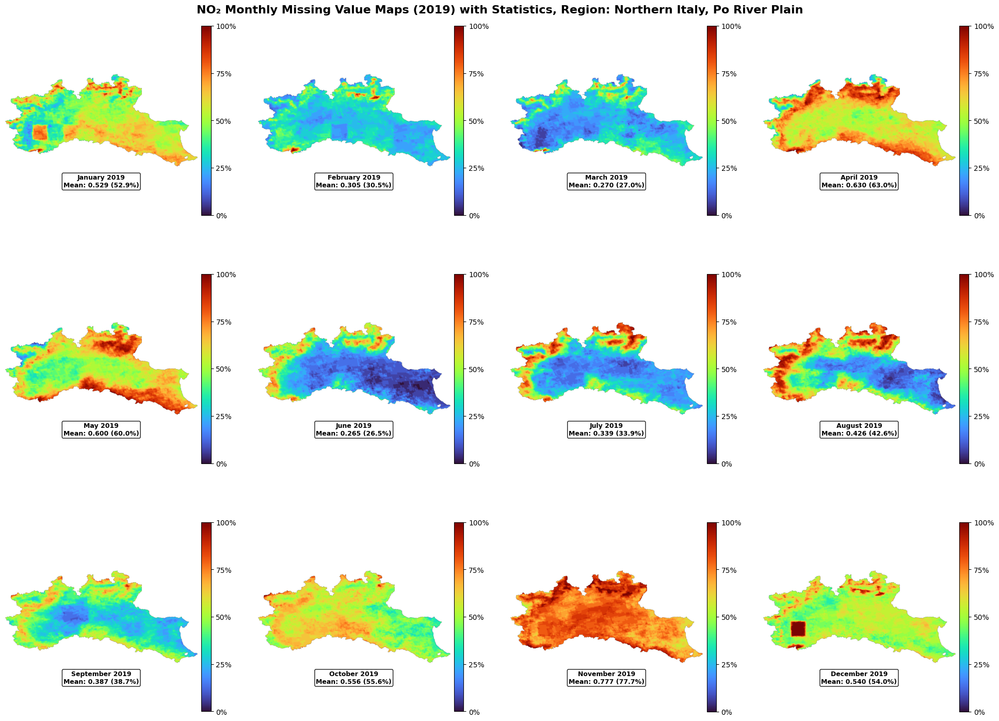


=== 2019 Monthly Statistics ===
Month        Days   Mean     Median   Std      Max     
------------------------------------------------------------
January      31     0.529    0.548    0.128    0.968
February     28     0.305    0.286    0.098    1.000
March        31     0.270    0.258    0.112    0.968
April        30     0.630    0.600    0.128    1.000
May          31     0.600    0.581    0.155    1.000
June         30     0.265    0.200    0.194    0.900
July         31     0.339    0.258    0.210    1.000
August       31     0.426    0.387    0.246    1.000
September    30     0.387    0.367    0.139    0.900
October      31     0.556    0.548    0.099    1.000
November     30     0.777    0.767    0.081    1.000
December     31     0.540    0.516    0.108    1.000

=== Seasonal Comparison ===
Winter (DJF): Mean missing rate = 0.458 (45.8%)
Spring (MAM): Mean missing rate = 0.500 (50.0%)
Summer (JJA): Mean missing rate = 0.343 (34.3%)
Autumn (SON): Mean missing rate = 0.573 (

In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get indices for a specific month
def get_month_indices(year, month):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    if month == 1:  # January
        month_start = 0
    else:
        month_start = sum(days_in_month[:month-1])
    month_end = month_start + days_in_month[month-1]
    return list(range(month_start, month_end))

# Function to calculate monthly missing rate
def calculate_monthly_missing_rate(year, month):
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()

        # Get month indices
        month_indices = get_month_indices(year, month)
        month_bands = bands[month_indices, :, :]

        # Calculate missing values
        mask = (month_bands <= 0) | np.isnan(month_bands)
        monthly_gap = np.sum(mask, axis=0)
        total_days = month_bands.shape[0]

        # Calculate missing rate
        gap_ratio = monthly_gap / total_days

        return gap_ratio, total_days

# Calculate missing rates for all months in 2019
year = 2019
monthly_gaps = {}
monthly_days = {}

print(f"=== Calculating 2019 Monthly Missing Rates ===")
for month in range(1, 13):
    gap_ratio, total_days = calculate_monthly_missing_rate(year, month)
    monthly_gaps[month] = gap_ratio
    monthly_days[month] = total_days
    print(f"{calendar.month_name[month]}: {total_days} days")

# Get spatial extent and transform
with rasterio.open(file_template.format(year)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to all months
masked_monthly_gaps = {}
for month in range(1, 13):
    masked_monthly_gaps[month] = ma.masked_where(~aoi_mask, monthly_gaps[month])

# Create visualization - 3x4 grid for 12 months with statistics
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

month_names = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

for i, month in enumerate(range(1, 13)):
    im = axes[i].imshow(masked_monthly_gaps[month], extent=extent, cmap='turbo', vmin=0, vmax=1)
    axes[i].axis('off')

    # Add colorbar for each subplot
    cbar = plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.02)
    cbar.set_ticks([0, 0.25, 0.5, 0.75, 1.0])
    cbar.set_ticklabels(['0%', '25%', '50%', '75%', '100%'])

    # Calculate statistics and add title below the map
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)

    axes[i].text(0.5, -0.08, f"{month_names[i]} 2019\nMean: {mean_missing:.3f} ({mean_missing*100:.1f}%)",
                 ha='center', va='top', transform=axes[i].transAxes,
                 fontsize=9, fontweight='bold', bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.9))

plt.tight_layout(pad=3.0)
plt.suptitle("NO₂ Monthly Missing Value Maps (2019) with Statistics, Region: Northern Italy, Po River Plain",
             fontsize=16, fontweight='bold', y=0.97)

# Save high-resolution image
plt.savefig('/gdrive/My Drive/NO2_2019_monthly_gap_maps_highres.png',
            dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
print("High-resolution image saved: NO2_2019_monthly_gap_maps_highres.png")

plt.show()

# Create statistics table
print(f"\n=== 2019 Monthly Statistics ===")
print(f"{'Month':<12} {'Days':<6} {'Mean':<8} {'Median':<8} {'Std':<8} {'Max':<8}")
print("-" * 60)

for month in range(1, 13):
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)
    median_missing = np.median(valid_data)
    std_missing = np.std(valid_data)
    max_missing = np.max(valid_data)

    print(f"{month_names[month-1]:<12} {monthly_days[month]:<6} "
          f"{mean_missing:.3f}    {median_missing:.3f}    {std_missing:.3f}    {max_missing:.3f}")

# Create seasonal comparison
print(f"\n=== Seasonal Comparison ===")
seasons = {
    'Winter (DJF)': [12, 1, 2],
    'Spring (MAM)': [3, 4, 5],
    'Summer (JJA)': [6, 7, 8],
    'Autumn (SON)': [9, 10, 11]
}

for season_name, months in seasons.items():
    season_data = []
    for month in months:
        season_data.extend(masked_monthly_gaps[month].compressed())

    mean_missing = np.mean(season_data)
    print(f"{season_name}: Mean missing rate = {mean_missing:.3f} ({mean_missing*100:.1f}%)")

# Create southwest region analysis
print(f"\n=== Southwest Region Analysis ===")
height, width = out_shape
southwest_region = (slice(height//2, None), slice(None, width//2))

for month in range(1, 13):
    sw_data = masked_monthly_gaps[month][southwest_region].compressed()
    sw_mean = np.mean(sw_data)
    sw_max = np.max(sw_data)

    # Check for high missing rate areas (>60%)
    high_missing = sw_data > 0.6
    high_missing_percentage = np.sum(high_missing) / len(sw_data) * 100

    print(f"{month_names[month-1]:<12}: Mean={sw_mean:.3f} ({sw_mean*100:.1f}%), "
          f"Max={sw_max:.3f} ({sw_max*100:.1f}%), "
          f"High missing (>60%): {high_missing_percentage:.1f}%")



print(f"\n=== Summary ===")
print("This visualization shows the monthly missing value patterns for 2019.")
print("Look for the southwest square pattern in winter months (Dec, Jan, Feb).")
print("Compare with summer months (Jun, Jul, Aug) to see seasonal differences.")

## 15. NO₂ Monthly Missing Value Maps (2020) with Statistics -- To analyze abnormal squares

=== Calculating 2020 Monthly Missing Rates ===
January: 31 days
February: 29 days
March: 31 days
April: 30 days
May: 31 days
June: 30 days
July: 31 days
August: 31 days
September: 30 days
October: 31 days
November: 30 days
December: 31 days
High-resolution image saved: NO2_2020_monthly_gap_maps_highres.png


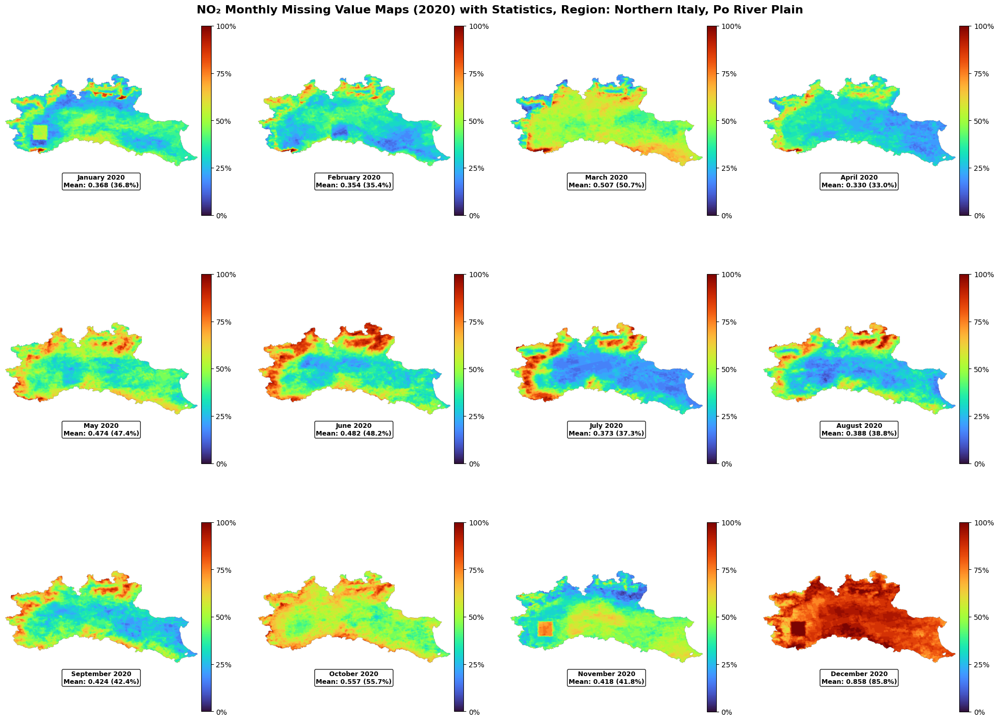


=== 2020 Monthly Statistics ===
Month        Days   Mean     Median   Std      Max     
------------------------------------------------------------
January      31     0.368    0.355    0.122    1.000
February     29     0.354    0.345    0.121    1.000
March        31     0.507    0.516    0.119    1.000
April        30     0.330    0.300    0.118    1.000
May          31     0.474    0.452    0.130    1.000
June         30     0.482    0.433    0.196    1.000
July         31     0.373    0.290    0.215    1.000
August       31     0.388    0.355    0.174    1.000
September    30     0.424    0.400    0.158    1.000
October      31     0.557    0.548    0.105    0.935
November     30     0.418    0.433    0.131    0.900
December     31     0.858    0.871    0.081    1.000

=== Seasonal Comparison ===
Winter (DJF): Mean missing rate = 0.526 (52.6%)
Spring (MAM): Mean missing rate = 0.437 (43.7%)
Summer (JJA): Mean missing rate = 0.415 (41.5%)
Autumn (SON): Mean missing rate = 0.466 (

In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get indices for a specific month
def get_month_indices(year, month):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    if month == 1:  # January
        month_start = 0
    else:
        month_start = sum(days_in_month[:month-1])
    month_end = month_start + days_in_month[month-1]
    return list(range(month_start, month_end))

# Function to calculate monthly missing rate
def calculate_monthly_missing_rate(year, month):
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()

        # Get month indices
        month_indices = get_month_indices(year, month)
        month_bands = bands[month_indices, :, :]

        # Calculate missing values
        mask = (month_bands <= 0) | np.isnan(month_bands)
        monthly_gap = np.sum(mask, axis=0)
        total_days = month_bands.shape[0]

        # Calculate missing rate
        gap_ratio = monthly_gap / total_days

        return gap_ratio, total_days

# Calculate missing rates for all months in 2020
year = 2020
monthly_gaps = {}
monthly_days = {}

print(f"=== Calculating 2020 Monthly Missing Rates ===")
for month in range(1, 13):
    gap_ratio, total_days = calculate_monthly_missing_rate(year, month)
    monthly_gaps[month] = gap_ratio
    monthly_days[month] = total_days
    print(f"{calendar.month_name[month]}: {total_days} days")

# Get spatial extent and transform
with rasterio.open(file_template.format(year)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to all months
masked_monthly_gaps = {}
for month in range(1, 13):
    masked_monthly_gaps[month] = ma.masked_where(~aoi_mask, monthly_gaps[month])

# Create visualization - 3x4 grid for 12 months with statistics
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

month_names = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

for i, month in enumerate(range(1, 13)):
    im = axes[i].imshow(masked_monthly_gaps[month], extent=extent, cmap='turbo', vmin=0, vmax=1)
    axes[i].axis('off')

    # Add colorbar for each subplot
    cbar = plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.02)
    cbar.set_ticks([0, 0.25, 0.5, 0.75, 1.0])
    cbar.set_ticklabels(['0%', '25%', '50%', '75%', '100%'])

    # Calculate statistics and add title below the map
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)

    axes[i].text(0.5, -0.08, f"{month_names[i]} 2020\nMean: {mean_missing:.3f} ({mean_missing*100:.1f}%)",
                 ha='center', va='top', transform=axes[i].transAxes,
                 fontsize=9, fontweight='bold', bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.9))

plt.tight_layout(pad=3.0)
plt.suptitle("NO₂ Monthly Missing Value Maps (2020) with Statistics, Region: Northern Italy, Po River Plain",
             fontsize=16, fontweight='bold', y=0.97)

# Save high-resolution image
plt.savefig('/gdrive/My Drive/NO2_2020_monthly_gap_maps_highres.png',
            dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
print("High-resolution image saved: NO2_2020_monthly_gap_maps_highres.png")

plt.show()

# Create statistics table
print(f"\n=== 2020 Monthly Statistics ===")
print(f"{'Month':<12} {'Days':<6} {'Mean':<8} {'Median':<8} {'Std':<8} {'Max':<8}")
print("-" * 60)

for month in range(1, 13):
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)
    median_missing = np.median(valid_data)
    std_missing = np.std(valid_data)
    max_missing = np.max(valid_data)

    print(f"{month_names[month-1]:<12} {monthly_days[month]:<6} "
          f"{mean_missing:.3f}    {median_missing:.3f}    {std_missing:.3f}    {max_missing:.3f}")

# Create seasonal comparison
print(f"\n=== Seasonal Comparison ===")
seasons = {
    'Winter (DJF)': [12, 1, 2],
    'Spring (MAM)': [3, 4, 5],
    'Summer (JJA)': [6, 7, 8],
    'Autumn (SON)': [9, 10, 11]
}

for season_name, months in seasons.items():
    season_data = []
    for month in months:
        season_data.extend(masked_monthly_gaps[month].compressed())

    mean_missing = np.mean(season_data)
    print(f"{season_name}: Mean missing rate = {mean_missing:.3f} ({mean_missing*100:.1f}%)")

# Create southwest region analysis
print(f"\n=== Southwest Region Analysis ===")
height, width = out_shape
southwest_region = (slice(height//2, None), slice(None, width//2))

for month in range(1, 13):
    sw_data = masked_monthly_gaps[month][southwest_region].compressed()
    sw_mean = np.mean(sw_data)
    sw_max = np.max(sw_data)

    # Check for high missing rate areas (>60%)
    high_missing = sw_data > 0.6
    high_missing_percentage = np.sum(high_missing) / len(sw_data) * 100

    print(f"{month_names[month-1]:<12}: Mean={sw_mean:.3f} ({sw_mean*100:.1f}%), "
          f"Max={sw_max:.3f} ({sw_max*100:.1f}%), "
          f"High missing (>60%): {high_missing_percentage:.1f}%")



print(f"\n=== Summary ===")
print("This visualization shows the monthly missing value patterns for 2020.")
print("Look for the southwest square pattern in winter months (Dec, Jan, Feb).")
print("Compare with summer months (Jun, Jul, Aug) to see seasonal differences.")

## 16. NO₂ Monthly Missing Value Maps (2021) with Statistics -- To analyze abnormal squares

=== Calculating 2021 Monthly Missing Rates ===
January: 31 days
February: 28 days
March: 31 days
April: 30 days
May: 31 days
June: 30 days
July: 31 days
August: 31 days
September: 30 days
October: 31 days
November: 30 days
December: 31 days
High-resolution image saved: NO2_2021_monthly_gap_maps_highres.png


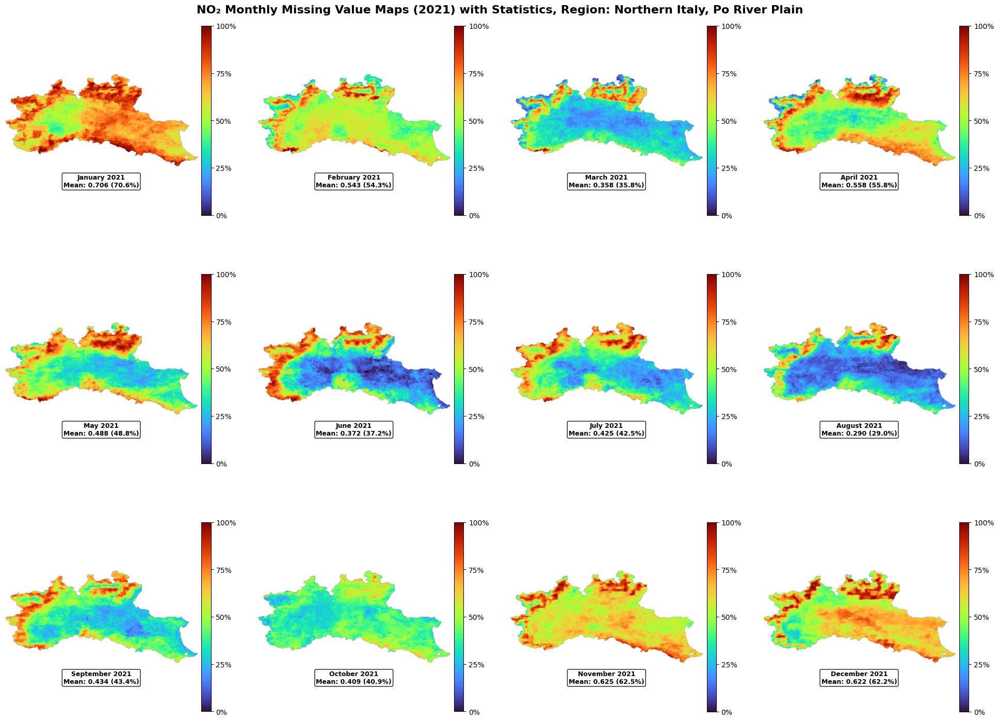


=== 2021 Monthly Statistics ===
Month        Days   Mean     Median   Std      Max     
------------------------------------------------------------
January      31     0.706    0.710    0.124    1.000
February     28     0.543    0.536    0.113    1.000
March        31     0.358    0.323    0.166    1.000
April        30     0.558    0.533    0.159    1.000
May          31     0.488    0.452    0.186    1.000
June         30     0.372    0.300    0.246    1.000
July         31     0.425    0.387    0.199    1.000
August       31     0.290    0.226    0.196    1.000
September    30     0.434    0.400    0.173    0.967
October      31     0.409    0.387    0.084    0.839
November     30     0.625    0.600    0.103    1.000
December     31     0.622    0.645    0.135    1.000

=== Seasonal Comparison ===
Winter (DJF): Mean missing rate = 0.624 (62.4%)
Spring (MAM): Mean missing rate = 0.468 (46.8%)
Summer (JJA): Mean missing rate = 0.362 (36.2%)
Autumn (SON): Mean missing rate = 0.489 (

In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get indices for a specific month
def get_month_indices(year, month):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    if month == 1:  # January
        month_start = 0
    else:
        month_start = sum(days_in_month[:month-1])
    month_end = month_start + days_in_month[month-1]
    return list(range(month_start, month_end))

# Function to calculate monthly missing rate
def calculate_monthly_missing_rate(year, month):
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()

        # Get month indices
        month_indices = get_month_indices(year, month)
        month_bands = bands[month_indices, :, :]

        # Calculate missing values
        mask = (month_bands <= 0) | np.isnan(month_bands)
        monthly_gap = np.sum(mask, axis=0)
        total_days = month_bands.shape[0]

        # Calculate missing rate
        gap_ratio = monthly_gap / total_days

        return gap_ratio, total_days

# Calculate missing rates for all months in 2021
year = 2021
monthly_gaps = {}
monthly_days = {}

print(f"=== Calculating 2021 Monthly Missing Rates ===")
for month in range(1, 13):
    gap_ratio, total_days = calculate_monthly_missing_rate(year, month)
    monthly_gaps[month] = gap_ratio
    monthly_days[month] = total_days
    print(f"{calendar.month_name[month]}: {total_days} days")

# Get spatial extent and transform
with rasterio.open(file_template.format(year)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to all months
masked_monthly_gaps = {}
for month in range(1, 13):
    masked_monthly_gaps[month] = ma.masked_where(~aoi_mask, monthly_gaps[month])

# Create visualization - 3x4 grid for 12 months with statistics
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

month_names = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

for i, month in enumerate(range(1, 13)):
    im = axes[i].imshow(masked_monthly_gaps[month], extent=extent, cmap='turbo', vmin=0, vmax=1)
    axes[i].axis('off')

    # Add colorbar for each subplot
    cbar = plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.02)
    cbar.set_ticks([0, 0.25, 0.5, 0.75, 1.0])
    cbar.set_ticklabels(['0%', '25%', '50%', '75%', '100%'])

    # Calculate statistics and add title below the map
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)

    axes[i].text(0.5, -0.08, f"{month_names[i]} 2021\nMean: {mean_missing:.3f} ({mean_missing*100:.1f}%)",
                 ha='center', va='top', transform=axes[i].transAxes,
                 fontsize=9, fontweight='bold', bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.9))

plt.tight_layout(pad=3.0)
plt.suptitle("NO₂ Monthly Missing Value Maps (2021) with Statistics, Region: Northern Italy, Po River Plain",
             fontsize=16, fontweight='bold', y=0.97)

# Save high-resolution image
plt.savefig('/gdrive/My Drive/NO2_2021_monthly_gap_maps_highres.png',
            dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
print("High-resolution image saved: NO2_2021_monthly_gap_maps_highres.png")

plt.show()

# Create statistics table
print(f"\n=== 2021 Monthly Statistics ===")
print(f"{'Month':<12} {'Days':<6} {'Mean':<8} {'Median':<8} {'Std':<8} {'Max':<8}")
print("-" * 60)

for month in range(1, 13):
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)
    median_missing = np.median(valid_data)
    std_missing = np.std(valid_data)
    max_missing = np.max(valid_data)

    print(f"{month_names[month-1]:<12} {monthly_days[month]:<6} "
          f"{mean_missing:.3f}    {median_missing:.3f}    {std_missing:.3f}    {max_missing:.3f}")

# Create seasonal comparison
print(f"\n=== Seasonal Comparison ===")
seasons = {
    'Winter (DJF)': [12, 1, 2],
    'Spring (MAM)': [3, 4, 5],
    'Summer (JJA)': [6, 7, 8],
    'Autumn (SON)': [9, 10, 11]
}

for season_name, months in seasons.items():
    season_data = []
    for month in months:
        season_data.extend(masked_monthly_gaps[month].compressed())

    mean_missing = np.mean(season_data)
    print(f"{season_name}: Mean missing rate = {mean_missing:.3f} ({mean_missing*100:.1f}%)")

# Create southwest region analysis
print(f"\n=== Southwest Region Analysis ===")
height, width = out_shape
southwest_region = (slice(height//2, None), slice(None, width//2))

for month in range(1, 13):
    sw_data = masked_monthly_gaps[month][southwest_region].compressed()
    sw_mean = np.mean(sw_data)
    sw_max = np.max(sw_data)

    # Check for high missing rate areas (>60%)
    high_missing = sw_data > 0.6
    high_missing_percentage = np.sum(high_missing) / len(sw_data) * 100

    print(f"{month_names[month-1]:<12}: Mean={sw_mean:.3f} ({sw_mean*100:.1f}%), "
          f"Max={sw_max:.3f} ({sw_max*100:.1f}%), "
          f"High missing (>60%): {high_missing_percentage:.1f}%")



print(f"\n=== Summary ===")
print("This visualization shows the monthly missing value patterns for 2021.")
print("Look for the southwest square pattern in winter months (Dec, Jan, Feb).")
print("Compare with summer months (Jun, Jul, Aug) to see seasonal differences.")

## 17. NO₂ Monthly Missing Value Maps (2022) with Statistics -- To analyze abnormal squares

=== Calculating 2022 Monthly Missing Rates ===
January: 31 days
February: 28 days
March: 31 days
April: 30 days
May: 31 days
June: 30 days
July: 31 days
August: 31 days
September: 30 days
October: 31 days
November: 30 days
December: 31 days
High-resolution image saved: NO2_2022_monthly_gap_maps_highres.png


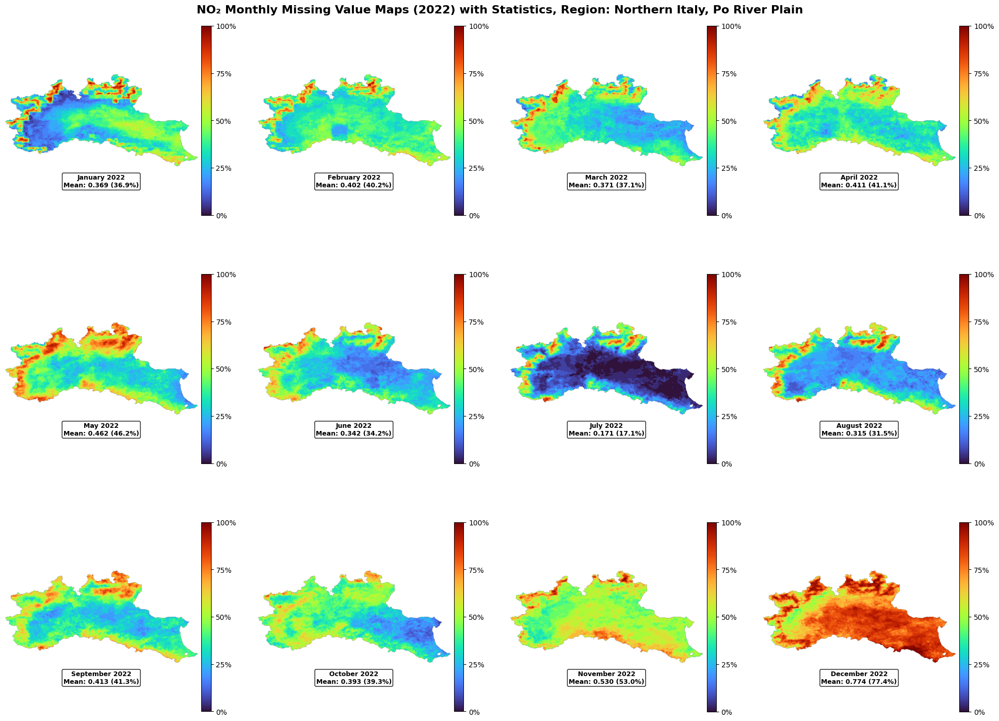


=== 2022 Monthly Statistics ===
Month        Days   Mean     Median   Std      Max     
------------------------------------------------------------
January      31     0.369    0.355    0.176    1.000
February     28     0.402    0.393    0.111    1.000
March        31     0.371    0.355    0.139    0.968
April        30     0.411    0.400    0.122    0.967
May          31     0.462    0.419    0.174    0.968
June         30     0.342    0.300    0.153    0.967
July         31     0.171    0.097    0.192    0.903
August       31     0.315    0.226    0.175    0.935
September    30     0.413    0.367    0.150    0.933
October      31     0.393    0.419    0.134    0.903
November     30     0.530    0.500    0.098    1.000
December     31     0.774    0.806    0.118    1.000

=== Seasonal Comparison ===
Winter (DJF): Mean missing rate = 0.515 (51.5%)
Spring (MAM): Mean missing rate = 0.415 (41.5%)
Summer (JJA): Mean missing rate = 0.276 (27.6%)
Autumn (SON): Mean missing rate = 0.445 (

In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get indices for a specific month
def get_month_indices(year, month):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    if month == 1:  # January
        month_start = 0
    else:
        month_start = sum(days_in_month[:month-1])
    month_end = month_start + days_in_month[month-1]
    return list(range(month_start, month_end))

# Function to calculate monthly missing rate
def calculate_monthly_missing_rate(year, month):
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()

        # Get month indices
        month_indices = get_month_indices(year, month)
        month_bands = bands[month_indices, :, :]

        # Calculate missing values
        mask = (month_bands <= 0) | np.isnan(month_bands)
        monthly_gap = np.sum(mask, axis=0)
        total_days = month_bands.shape[0]

        # Calculate missing rate
        gap_ratio = monthly_gap / total_days

        return gap_ratio, total_days

# Calculate missing rates for all months in 2022
year = 2022
monthly_gaps = {}
monthly_days = {}

print(f"=== Calculating 2022 Monthly Missing Rates ===")
for month in range(1, 13):
    gap_ratio, total_days = calculate_monthly_missing_rate(year, month)
    monthly_gaps[month] = gap_ratio
    monthly_days[month] = total_days
    print(f"{calendar.month_name[month]}: {total_days} days")

# Get spatial extent and transform
with rasterio.open(file_template.format(year)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to all months
masked_monthly_gaps = {}
for month in range(1, 13):
    masked_monthly_gaps[month] = ma.masked_where(~aoi_mask, monthly_gaps[month])

# Create visualization - 3x4 grid for 12 months with statistics
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

month_names = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

for i, month in enumerate(range(1, 13)):
    im = axes[i].imshow(masked_monthly_gaps[month], extent=extent, cmap='turbo', vmin=0, vmax=1)
    axes[i].axis('off')

    # Add colorbar for each subplot
    cbar = plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.02)
    cbar.set_ticks([0, 0.25, 0.5, 0.75, 1.0])
    cbar.set_ticklabels(['0%', '25%', '50%', '75%', '100%'])

    # Calculate statistics and add title below the map
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)

    axes[i].text(0.5, -0.08, f"{month_names[i]} 2022\nMean: {mean_missing:.3f} ({mean_missing*100:.1f}%)",
                 ha='center', va='top', transform=axes[i].transAxes,
                 fontsize=9, fontweight='bold', bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.9))

plt.tight_layout(pad=3.0)
plt.suptitle("NO₂ Monthly Missing Value Maps (2022) with Statistics, Region: Northern Italy, Po River Plain",
             fontsize=16, fontweight='bold', y=0.97)

# Save high-resolution image
plt.savefig('/gdrive/My Drive/NO2_2022_monthly_gap_maps_highres.png',
            dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
print("High-resolution image saved: NO2_2022_monthly_gap_maps_highres.png")

plt.show()

# Create statistics table
print(f"\n=== 2022 Monthly Statistics ===")
print(f"{'Month':<12} {'Days':<6} {'Mean':<8} {'Median':<8} {'Std':<8} {'Max':<8}")
print("-" * 60)

for month in range(1, 13):
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)
    median_missing = np.median(valid_data)
    std_missing = np.std(valid_data)
    max_missing = np.max(valid_data)

    print(f"{month_names[month-1]:<12} {monthly_days[month]:<6} "
          f"{mean_missing:.3f}    {median_missing:.3f}    {std_missing:.3f}    {max_missing:.3f}")

# Create seasonal comparison
print(f"\n=== Seasonal Comparison ===")
seasons = {
    'Winter (DJF)': [12, 1, 2],
    'Spring (MAM)': [3, 4, 5],
    'Summer (JJA)': [6, 7, 8],
    'Autumn (SON)': [9, 10, 11]
}

for season_name, months in seasons.items():
    season_data = []
    for month in months:
        season_data.extend(masked_monthly_gaps[month].compressed())

    mean_missing = np.mean(season_data)
    print(f"{season_name}: Mean missing rate = {mean_missing:.3f} ({mean_missing*100:.1f}%)")

# Create southwest region analysis
print(f"\n=== Southwest Region Analysis ===")
height, width = out_shape
southwest_region = (slice(height//2, None), slice(None, width//2))

for month in range(1, 13):
    sw_data = masked_monthly_gaps[month][southwest_region].compressed()
    sw_mean = np.mean(sw_data)
    sw_max = np.max(sw_data)

    # Check for high missing rate areas (>60%)
    high_missing = sw_data > 0.6
    high_missing_percentage = np.sum(high_missing) / len(sw_data) * 100

    print(f"{month_names[month-1]:<12}: Mean={sw_mean:.3f} ({sw_mean*100:.1f}%), "
          f"Max={sw_max:.3f} ({sw_max*100:.1f}%), "
          f"High missing (>60%): {high_missing_percentage:.1f}%")



print(f"\n=== Summary ===")
print("This visualization shows the monthly missing value patterns for 2022.")
print("Look for the southwest square pattern in winter months (Dec, Jan, Feb).")
print("Compare with summer months (Jun, Jul, Aug) to see seasonal differences.")

## 18. NO₂ Monthly Missing Value Maps (2023) with Statistics -- To analyze abnormal squares

=== Calculating 2023 Monthly Missing Rates ===
January: 31 days
February: 28 days
March: 31 days
April: 30 days
May: 31 days
June: 30 days
July: 31 days
August: 31 days
September: 30 days
October: 31 days
November: 30 days
December: 31 days
High-resolution image saved: NO2_2023_monthly_gap_maps_highres.png


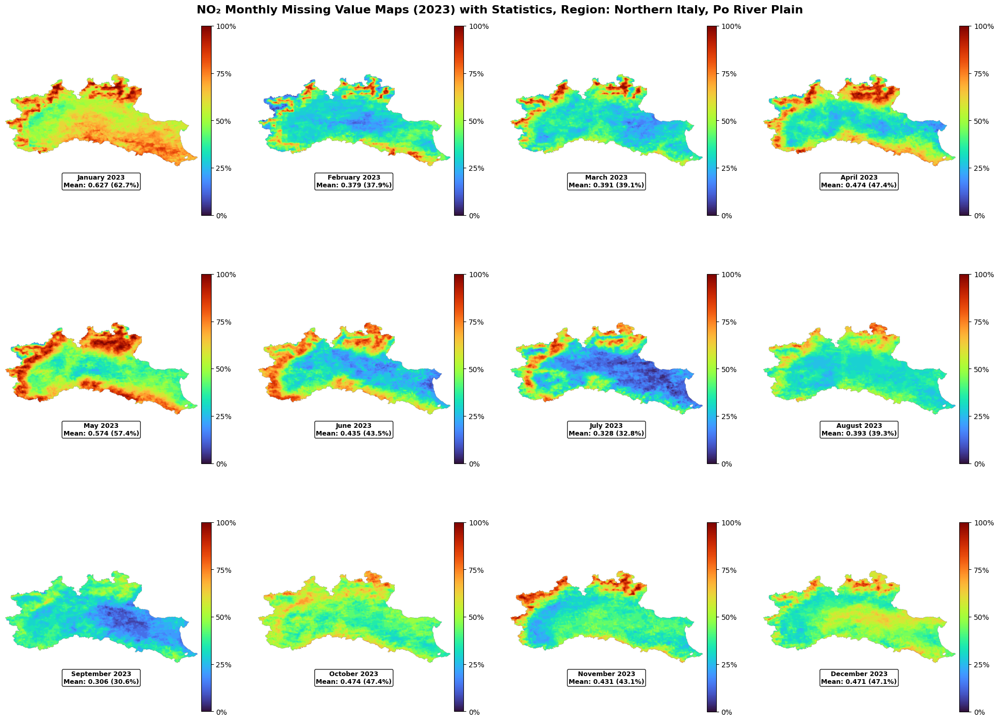


=== 2023 Monthly Statistics ===
Month        Days   Mean     Median   Std      Max     
------------------------------------------------------------
January      31     0.627    0.613    0.119    1.000
February     28     0.379    0.321    0.148    1.000
March        31     0.391    0.355    0.154    1.000
April        30     0.474    0.433    0.184    1.000
May          31     0.574    0.516    0.184    1.000
June         30     0.435    0.367    0.199    0.933
July         31     0.328    0.290    0.200    0.968
August       31     0.393    0.355    0.117    0.903
September    30     0.306    0.300    0.105    0.767
October      31     0.474    0.452    0.096    0.903
November     30     0.431    0.400    0.151    1.000
December     31     0.471    0.452    0.106    0.935

=== Seasonal Comparison ===
Winter (DJF): Mean missing rate = 0.492 (49.2%)
Spring (MAM): Mean missing rate = 0.480 (48.0%)
Summer (JJA): Mean missing rate = 0.385 (38.5%)
Autumn (SON): Mean missing rate = 0.403 (

In [ ]:
import rasterio
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import calendar
import geopandas as gpd
from rasterio.features import geometry_mask

# Define file template
file_template = '/gdrive/My Drive/GEE_NO2/NO2_Daily_Multiband_{}.tif'

# Path to AOI shapefile
aoi_path = '/gdrive/My Drive/AOI/delimitazione_distretto.shp'
aoi = gpd.read_file(aoi_path)

# Function to get indices for a specific month
def get_month_indices(year, month):
    days_in_month = [calendar.monthrange(year, m)[1] for m in range(1, 13)]
    if month == 1:  # January
        month_start = 0
    else:
        month_start = sum(days_in_month[:month-1])
    month_end = month_start + days_in_month[month-1]
    return list(range(month_start, month_end))

# Function to calculate monthly missing rate
def calculate_monthly_missing_rate(year, month):
    file_path = file_template.format(year)
    with rasterio.open(file_path) as src:
        bands = src.read()

        # Get month indices
        month_indices = get_month_indices(year, month)
        month_bands = bands[month_indices, :, :]

        # Calculate missing values
        mask = (month_bands <= 0) | np.isnan(month_bands)
        monthly_gap = np.sum(mask, axis=0)
        total_days = month_bands.shape[0]

        # Calculate missing rate
        gap_ratio = monthly_gap / total_days

        return gap_ratio, total_days

# Calculate missing rates for all months in 2023
year = 2023
monthly_gaps = {}
monthly_days = {}

print(f"=== Calculating 2023 Monthly Missing Rates ===")
for month in range(1, 13):
    gap_ratio, total_days = calculate_monthly_missing_rate(year, month)
    monthly_gaps[month] = gap_ratio
    monthly_days[month] = total_days
    print(f"{calendar.month_name[month]}: {total_days} days")

# Get spatial extent and transform
with rasterio.open(file_template.format(year)) as src:
    bounds = src.bounds
    extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    transform = src.transform
    out_shape = (src.height, src.width)

# Create AOI mask
aoi_mask = geometry_mask([aoi.geometry.union_all()],
                        transform=transform,
                        invert=True,
                        out_shape=out_shape)

# Apply AOI mask to all months
masked_monthly_gaps = {}
for month in range(1, 13):
    masked_monthly_gaps[month] = ma.masked_where(~aoi_mask, monthly_gaps[month])

# Create visualization - 3x4 grid for 12 months with statistics
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

month_names = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

for i, month in enumerate(range(1, 13)):
    im = axes[i].imshow(masked_monthly_gaps[month], extent=extent, cmap='turbo', vmin=0, vmax=1)
    axes[i].axis('off')

    # Add colorbar for each subplot
    cbar = plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.02)
    cbar.set_ticks([0, 0.25, 0.5, 0.75, 1.0])
    cbar.set_ticklabels(['0%', '25%', '50%', '75%', '100%'])

    # Calculate statistics and add title below the map
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)

    axes[i].text(0.5, -0.08, f"{month_names[i]} 2023\nMean: {mean_missing:.3f} ({mean_missing*100:.1f}%)",
                 ha='center', va='top', transform=axes[i].transAxes,
                 fontsize=9, fontweight='bold', bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.9))

plt.tight_layout(pad=3.0)
plt.suptitle("NO₂ Monthly Missing Value Maps (2023) with Statistics, Region: Northern Italy, Po River Plain",
             fontsize=16, fontweight='bold', y=0.97)

# Save high-resolution image
plt.savefig('/gdrive/My Drive/NO2_2023_monthly_gap_maps_highres.png',
            dpi=300, bbox_inches='tight', facecolor='white', edgecolor='none')
print("High-resolution image saved: NO2_2023_monthly_gap_maps_highres.png")

plt.show()

# Create statistics table
print(f"\n=== 2023 Monthly Statistics ===")
print(f"{'Month':<12} {'Days':<6} {'Mean':<8} {'Median':<8} {'Std':<8} {'Max':<8}")
print("-" * 60)

for month in range(1, 13):
    valid_data = masked_monthly_gaps[month].compressed()
    mean_missing = np.mean(valid_data)
    median_missing = np.median(valid_data)
    std_missing = np.std(valid_data)
    max_missing = np.max(valid_data)

    print(f"{month_names[month-1]:<12} {monthly_days[month]:<6} "
          f"{mean_missing:.3f}    {median_missing:.3f}    {std_missing:.3f}    {max_missing:.3f}")

# Create seasonal comparison
print(f"\n=== Seasonal Comparison ===")
seasons = {
    'Winter (DJF)': [12, 1, 2],
    'Spring (MAM)': [3, 4, 5],
    'Summer (JJA)': [6, 7, 8],
    'Autumn (SON)': [9, 10, 11]
}

for season_name, months in seasons.items():
    season_data = []
    for month in months:
        season_data.extend(masked_monthly_gaps[month].compressed())

    mean_missing = np.mean(season_data)
    print(f"{season_name}: Mean missing rate = {mean_missing:.3f} ({mean_missing*100:.1f}%)")

# Create southwest region analysis
print(f"\n=== Southwest Region Analysis ===")
height, width = out_shape
southwest_region = (slice(height//2, None), slice(None, width//2))

for month in range(1, 13):
    sw_data = masked_monthly_gaps[month][southwest_region].compressed()
    sw_mean = np.mean(sw_data)
    sw_max = np.max(sw_data)

    # Check for high missing rate areas (>60%)
    high_missing = sw_data > 0.6
    high_missing_percentage = np.sum(high_missing) / len(sw_data) * 100

    print(f"{month_names[month-1]:<12}: Mean={sw_mean:.3f} ({sw_mean*100:.1f}%), "
          f"Max={sw_max:.3f} ({sw_max*100:.1f}%), "
          f"High missing (>60%): {high_missing_percentage:.1f}%")



print(f"\n=== Summary ===")
print("This visualization shows the monthly missing value patterns for 2023.")
print("Look for the southwest square pattern in winter months (Dec, Jan, Feb).")
print("Compare with summer months (Jun, Jul, Aug) to see seasonal differences.")

## Analysis of Data Gaps in Sentinel-5P NO₂ Observations (2019–2023)

A clear rectangular-shaped area of high missing data was observed in the southwestern part of the study region during specific winter months—January, November, and December of 2019 and 2020. December showed the most severe data loss. A less obvious version of this missing region was still present in January 2021. However, starting from November 2021 through 2023, this artificial missing block no longer appeared in any season.

The consistent shape and location of this missing area suggest that it was not caused by atmospheric or seasonal factors, but rather by limitations in the early Sentinel-5P data processing pipeline—likely related to tile stitching, gridding, or quality masking procedures. The complete disappearance of this issue after late 2021 strongly indicates that system-level improvements were implemented.

Implication for data reconstruction: Special handling is recommended for NO₂ observations from 2019 to 2020, particularly in the affected tile region, due to persistent missing values. In contrast, the data quality from 2021 onward is significantly improved, enabling the use of standard interpolation and gap-filling techniques without additional correction.